In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import meanderpy as mp             
from importlib import reload
reload(mp)
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as ptc
mpl.rcParams['figure.dpi'] = 500
import scipy.stats as stats          
import seaborn as sns                   
from scipy import interpolate          
import random

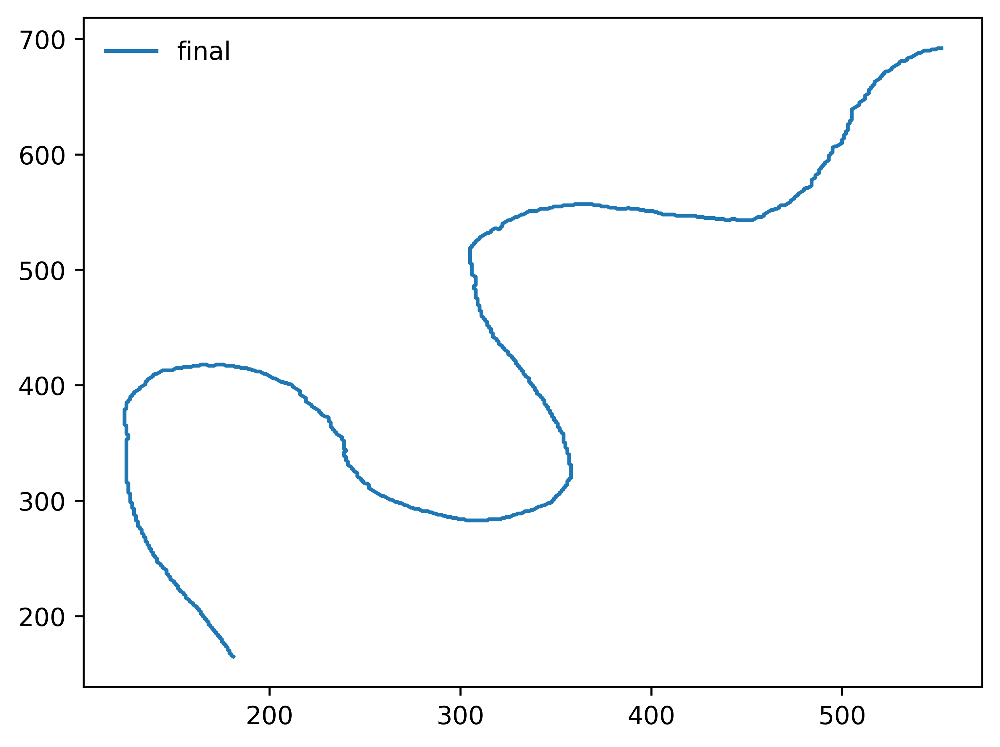

In [2]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend3")
cl1=np.loadtxt('0.3.txt',delimiter=' ')
cl2=np.loadtxt('10.3.txt',delimiter=' ')

y = cl1[:,0][::-1]
x = cl1[:,1][::-1]
y1 = cl2[:,0][::-1]
x1= cl2[:,1][::-1]

plt.plot(x1,y1,label = 'final')
plt.legend(frameon=False)

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 92.45it/s]

You are running this simulation for: 10.0 Years
Migration rate constant = 200.0 m/yr



/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/456633528.py:34: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  synx = 0.1*chb.channels[np.int(nit-1)].x
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/456633528.py:35: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your

<AxesSubplot:xlabel='x'>

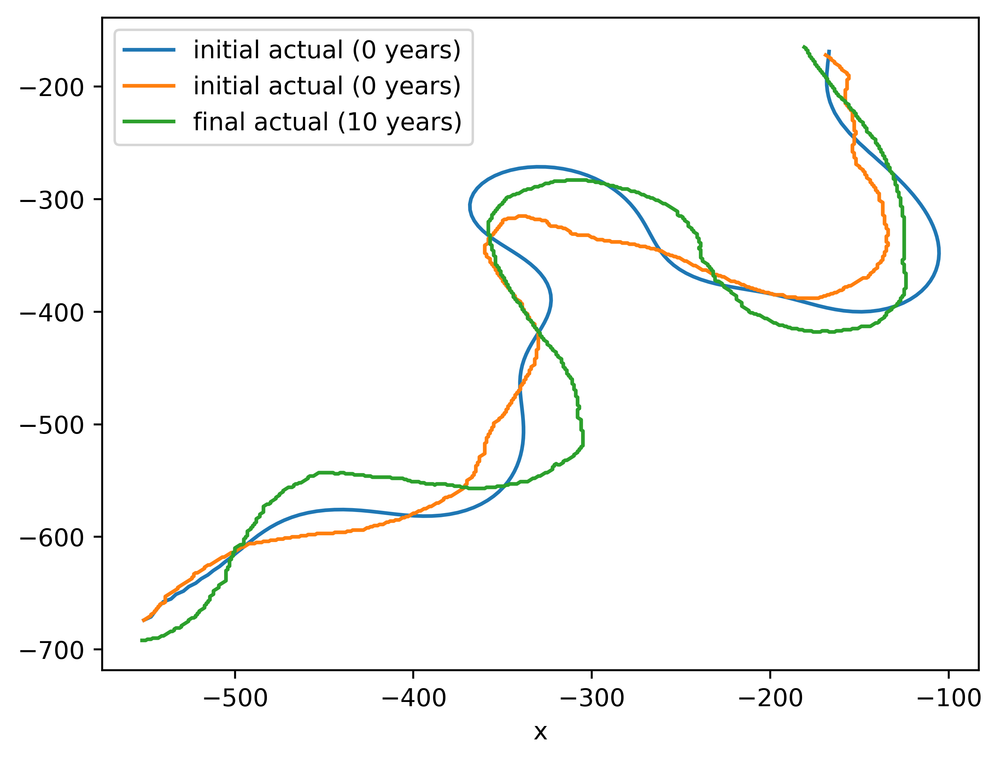

In [3]:
nit = 100                    # number of iterations
W = 100.0                    # channel width (m)
D = 10.0                      # channel depth (m)
depths = D * np.ones((nit,))  # channel depths for different iterations  
pad = 0# padding (number of nodepoints along centerline)
deltas = 50.0                # sampling distance along centerline           
Cfs = 0.02 * np.ones((nit,))
crdist = 1.8 * W               # threshold distance at which cutoffs occur
kl = 200/(365*24*60*60.0)   # migration rate constant (m/s)
kv =  1.0e-12               # vertical slope-dependent erosion rate constant (m/s)
dt = 0.1*(365*24*60*60.0)      # time step (s)
dens = 1000                  # density of water (kg/m3)
saved_ts = 1                # which time steps will be saved
Sl = 0.0                     # initial slope (matters more for submarine channels than rivers)
t1 = 0                    # time step when incision starts
t2 = 0                    # time step when lateral migration starts
t3 = 0     
aggr_factor = 2e-9            # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)
sc = 1.0
y=cl1[:,0]*10
x=cl1[:,1]*10
z=np.zeros(len(x))
H=depths[0]

ch=mp.Channel(-x,-y,z,W,H)
chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration
channel_coordinate = pd.DataFrame({"x":chb.channels[nit-1].x, "y":chb.channels[nit-1].y, "Z":chb.channels[nit-1].z}) # the way it work is this: chb.channels[i].x will give you the x coordinates for the ith time step
np.savetxt('output.txt', channel_coordinate, delimiter=',')

print('You are running this simulation for:', nit*dt/(365.*24*60*60),'Years')
print('Migration rate constant =', kl*60*60.*24.*365., 'm/yr')

synx = 0.1*chb.channels[np.int(nit-1)].x
syny = 0.1*chb.channels[np.int(nit-1)].y

np.savetxt('syn.txt', np.c_[syny,synx])
clsyn=np.loadtxt('syn.txt',delimiter=' ')
ax = pd.DataFrame({"x":clsyn[:,1], "y":clsyn[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)')
pd.DataFrame({"x":-cl1[:,1], "y":-cl1[:,0]}).plot.line(x='x', y='y', ax= ax, label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1], "y":-cl2[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (10 years)')

In [4]:
t = np.linspace(0,1,np.shape(cl1[:,])[0]) # create a new variable t 
x_o = -cl1[:,1].flatten()            # get x-axis data
y_o = -cl1[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,1000)   
xnew_o = fx_o(tnew) + np.random.normal(0,0.1,1000)  # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.1,1000)# create a finer t-variable spacing 
xnew_o = fx_o(tnew)   # get interpolated x values
ynew_o = fy_o(tnew)   # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 2) 
#data_obs_ins =np.flip(data_obs_ins, axis=1)

t = np.linspace(0,1,np.shape(cl2[:,])[0]) # create a new variable t 
x_o = -cl2[:,1].flatten()            # get x-axis data
y_o = -cl2[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,1000)           # create a finer t-variable spacing 
xnew_o = fx_o(tnew)                     # get interpolated x values
ynew_o = fy_o(tnew)
data_obs = np.array([xnew_o,ynew_o])
data_obs = np.flip(data_obs, axis=1)
data_obs = np.round(data_obs, 1)
# modelled

t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
x_m = 0.1*chb.channels[np.int(nit-1)].x
y_m = 0.1*chb.channels[np.int(nit-1)].y
fx_m = interpolate.interp1d(t,x_m)
fy_m = interpolate.interp1d(t, y_m)
tnew = np.linspace(0,1,1000)
xnew_m = fx_m(tnew)
ynew_m = fy_m(tnew)
ynew_ms = ynew_m+np.random.normal(loc=0.0, scale= 0.1, size=1)
xnew_ms = xnew_m+np.random.normal(loc=0.0, scale= 0.1, size=1)
ynew_ms = ynew_m
xnew_ms = xnew_m

/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/458386601.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/458386601.py:29: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. 

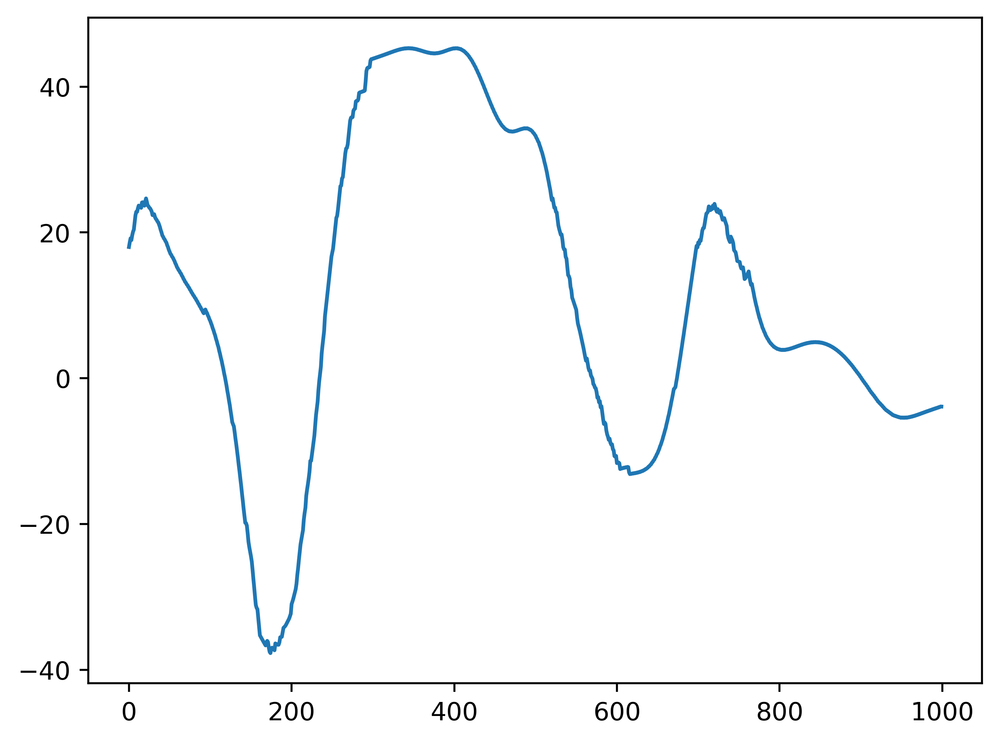

In [5]:
data_obs =np.flip(data_obs, axis=1)
err1 = data_obs_ins[0,:] - data_obs[0,:]
err2 = xnew_ms - data_obs[0,:]
plt.plot(ynew_ms - data_obs[1,:])

In [6]:
nit = 100                   
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0      

def hkm(parm):  
    kl =  (parm[0]*10)/(365*24*60*60.0)  
    Cfs = parm[1] * 0.001 * np.ones((nit,))
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]

    try:    
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = 0.1*chb.channels[np.int(nit-1)].x
            y_m = 0.1*chb.channels[np.int(nit-1)].y

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,1000)
            xnew_m = fx_m(tnew) 
            ynew_m = fy_m(tnew) 
            xnew_m[:] = xnew_m[::-1] 
            ynew_m[:] = ynew_m[::-1] 
        
        else:
            t = np.linspace(0,1,1000)
            xnew_m = np.zeros(1000) 
            ynew_m = np.zeros(1000) 
            ynew_m[:] = ynew_m[::-1] 
            xnew_m[:] = xnew_m[::-1] 

    except:
        t = np.linspace(0,1,1000)
        xnew_m = np.zeros(1000) 
        ynew_m = np.zeros(1000) 
        ynew_m[:] = ynew_m[::-1] 
        xnew_m[:] = xnew_m[::-1] 
        
    return np.array([xnew_m,ynew_m])

[15 20  1]
[15 20  1]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.82it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/115302430.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/115302430.py:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you m

-5036.771844813138

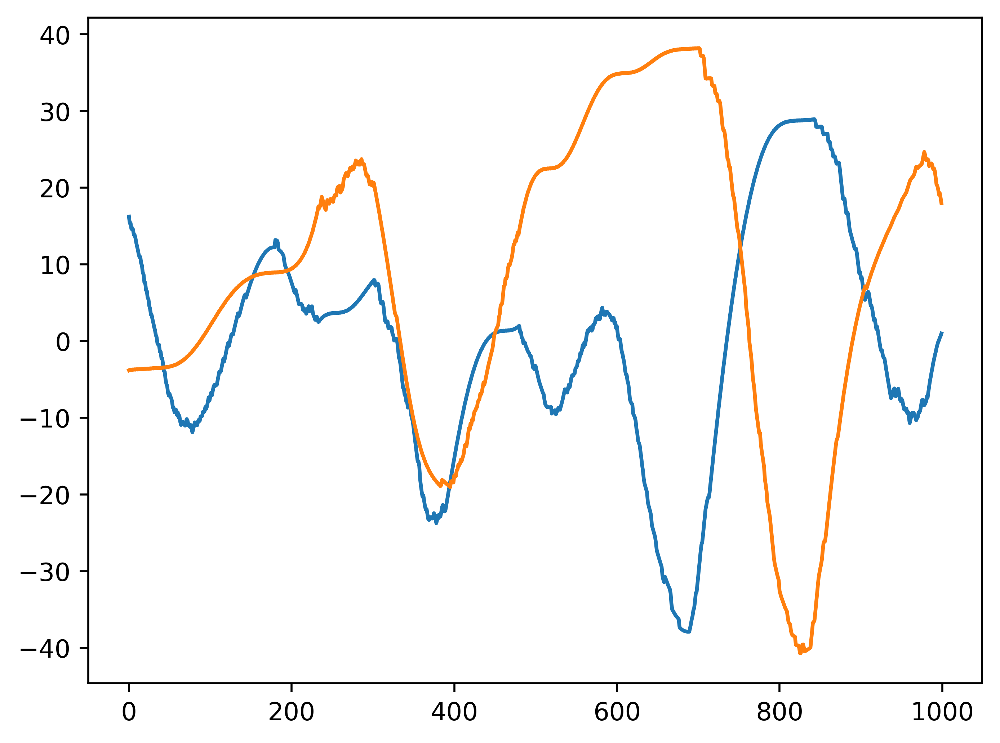

In [7]:
def log_prior(par):
    
    if  10 < par[0] < 50 and 0 < par[1] < 30 and 0.01 < par[2] < 10:   # define the bounds of the prior   
        return -par[2]/1                           # return the exponential distribution
    else:
        return -np.inf
    
def log_lik(par,data):
    print(par)
    sim = hkm(parm=par[:2])
    
    x_err = sim[0,:]-data[0,:][::-1]
    y_err = sim[1,:]-data[1,:][::-1]
    plt.plot(x_err) 
    plt.plot(y_err) 

    y_fft = np.fft.fft(y_err)  # do the fast fourier transform of y-errrors
    x_fft = np.fft.fft(x_err)  # do the fast fourier transform of x-errrors
    
    y_amp1 = 2*abs(y_fft.real/y_fft.size)      # retrieve amplitude of cos function
    y_amp2 = 2*abs(y_fft.imag/y_fft.size)      # retrieve amplitude of sin function
    x_amp1 = 2*abs(x_fft.real/x_fft.size)      # retrieve amplitude of cos function
    x_amp2 = 2*abs(x_fft.imag/x_fft.size)      # retrieve amplitude of sin function
    
    amp = np.array([y_amp1,y_amp2,x_amp1,x_amp2]) # write all four amplitudes in one array 
    
    return np.sum(np.log(stats.norm.pdf(amp, loc=0, scale=par[2]))) # evaluate the probability density of the amp array

def log_post(par, data):
    par = np.around(par, decimals = 0)
    print (par)
    if (log_prior(par)==-np.inf):
        lp = log_prior(par)
    else: 
        lp = log_lik(par,data)+ log_prior(par)
    return lp  

#Test Run
log_post([15,20 ,1],data_obs)

In [8]:
from scipy.stats import truncnorm
import emcee

def get_truncated_normal(mean=0, sd=1, low=0, upp=10):
    return truncnorm(
        (low - mean) / sd, (upp - mean) / sd, loc=mean, scale=sd)

ndim, nwalkers = 3, 50

X1 = get_truncated_normal(mean=10, sd=15, low=0, upp=50)
X2 = get_truncated_normal(mean=5, sd=10, low=0, upp=20)
X3 = get_truncated_normal(mean=2, sd=1, low=1, upp=5)

p0 = np.ones([nwalkers, ndim])
p0[:,0] = X1.rvs(size = nwalkers)
p0[:,1] = X2.rvs(size = nwalkers)
p0[:,2] = X3.rvs(size = nwalkers)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])

In [9]:
from scipy.stats import truncnorm
import emcee

def get_truncated_normal(mean=0, sd=1, low=0, upp=10):
    return truncnorm(
        (low - mean) / sd, (upp - mean) / sd, loc=mean, scale=sd)

ndim, nwalkers = 3, 50

X1 = get_truncated_normal(mean=15, sd=10, low=1, upp=40)
X2 = get_truncated_normal(mean=10, sd=10, low=1, upp=20)
X3 = get_truncated_normal(mean=2, sd=1, low=1, upp=5)

p0 = np.ones([nwalkers, ndim])
p0[:,0] = X1.rvs(size = nwalkers)
p0[:,1] = X2.rvs(size = nwalkers)
p0[:,2] = X3.rvs(size = nwalkers)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])

[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.94it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/115302430.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/115302430.py:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you m

[24. 15.  2.]
[24. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.06it/s]


[25. 20.  1.]
[25. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 417.42it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/3400913311.py:27: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(stats.norm.pdf(amp, loc=0, scale=par[2]))) # evaluate the probability density of the amp array


[14.  9.  3.]
[14.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.68it/s]


[23.  7.  1.]
[23.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 590.32it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.12it/s]


[20.  4.  2.]
[20.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.39it/s]


[10. 14.  2.]
[ 7. 12.  2.]
[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.22it/s]


[18.  8.  4.]
[18.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.00it/s]


[32.  1.  1.]
[32.  1.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 575.86it/s]


[30.  5.  2.]
[30.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.19it/s]


[ 9. 19.  5.]
[12.  9.  2.]
[12.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.99it/s]


[27.  1.  4.]
[27.  1.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.41it/s]


[29. 19.  3.]
[29. 19.  3.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 70.19it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.82it/s]


[22.  2.  4.]
[22.  2.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 564.67it/s]


[11. 16.  2.]
[11. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.78it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.63it/s]


[22. 14.  3.]
[22. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.58it/s]


[7. 3. 3.]
[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.15it/s]


[12.  6.  2.]
[12.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.72it/s]


[ 8. 11.  3.]
[11.  7.  2.]
[11.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.31it/s]


[24.  9.  3.]
[24.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.98it/s]


[ 6. 13.  2.]
[ 4. 10.  3.]
[30. 13.  2.]
[30. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 566.64it/s]


[21. 19.  2.]
[21. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 572.51it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.72it/s]


[23. 17.  1.]
[23. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.78it/s]


[19.  7.  2.]
[19.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.57it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.87it/s]


[31.  3.  2.]
[31.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 266.71it/s]


[27.  2.  1.]
[27.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.09it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.08it/s]


[28.  3.  2.]
[28.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 366.88it/s]


[23. 16.  2.]
[23. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 461.12it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.21it/s]


[ 7. 19.  1.]
[18.  2.  3.]
[18.  2.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.13it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 452.77it/s]


[ 9. 15.  2.]
[35. 15.  1.]
[35. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 250.52it/s]


[21. 15.  3.]
[21. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.28it/s]


[ 1. 16.  2.]
[ 5. 15.  2.]
[24. 16.  2.]
[24. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.50it/s]


[34. 22.  1.]
[34. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 441.43it/s]


[18.  8.  3.]
[18.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.16it/s]


[16.  4.  2.]
[16.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.22it/s]


[10. 15.  2.]
[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.94it/s]


[13. 10.  3.]
[13. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.54it/s]


[28.  3.  1.]
[28.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 451.20it/s]


[22.  6.  3.]
[22.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.41it/s]


[19.  7.  2.]
[19.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.98it/s]


[24. -2.  4.]
[28. 17.  4.]
[28. 17.  4.]


100%|█████████████████████████████████████████| 100/100 [00:02<00:00, 39.19it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.04it/s]


[ 7. 12.  3.]
[10.  8.  2.]
[20.  7.  3.]
[20.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.19it/s]


[ 3. 10.  3.]
[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.96it/s]


[22. 20.  1.]
[22. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.21it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.57it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.52it/s]


[38.  0.  2.]
[29.  2.  3.]
[29.  2.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.56it/s]


[31. 16.  3.]
[31. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.98it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.53it/s]
/Users/braydennoh/opt/anaconda3/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


[26.  6.  0.]
[27.  8.  1.]
[27.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.22it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.80it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.57it/s]


[28.  9.  2.]
[28.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.96it/s]


[ 6. 22.  6.]
[11.  7.  3.]
[11.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.09it/s]


[44. 23.  3.]
[44. 23.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 397.11it/s]


[ 8. 13.  2.]
[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.81it/s]


[12.  6.  3.]
[12.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.38it/s]


[5. 5. 0.]
[ 0. 19.  2.]
[33. 15.  2.]
[33. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 431.40it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 551.51it/s]


[28.  1.  1.]
[28.  1.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.52it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.85it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.45it/s]


[13. 19.  1.]
[13. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.76it/s]


[18.  2.  3.]
[18.  2.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.06it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.24it/s]


[12. 13.  2.]
[12. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.37it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.62it/s]


[-0. 17.  2.]
[ 6. 17.  2.]
[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.14it/s]


[42. 24.  1.]
[42. 24.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 252.72it/s]


[39.  2.  1.]
[39.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.09it/s]


[10.  9.  4.]
[35.  7.  2.]
[35.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.45it/s]


[22.  0.  5.]
[43. 23.  3.]
[43. 23.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 407.92it/s]


[29.  3.  1.]
[29.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.00it/s]


[36. -8.  5.]
[10. 14.  2.]
[28. 17.  1.]
[28. 17.  1.]


100%|█████████████████████████████████████████| 100/100 [00:02<00:00, 36.49it/s]


[22. 14.  3.]
[22. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 448.76it/s]


[6. 9. 1.]
[13.  2.  1.]
[13.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 563.27it/s]


[10.  8.  2.]
[17.  8.  3.]
[17.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.31it/s]


[ 2. 10.  3.]
[46. 12.  2.]
[46. 12.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 53.75it/s]


[27. 19.  1.]
[27. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.55it/s]


[18. 10.  3.]
[18. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.20it/s]


[20.  3. -0.]
[28.  3.  3.]
[28.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.75it/s]


[23. 10.  2.]
[23. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.30it/s]


[20.  1.  3.]
[20.  1.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.52it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.98it/s]


[30.  7.  1.]
[30.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.31it/s]


[20.  9.  4.]
[20.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.83it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.92it/s]


[19.  2.  2.]
[19.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.60it/s]


[ 9. 14.  3.]
[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.72it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.70it/s]


[29.  5.  2.]
[29.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.33it/s]


[11. 16.  4.]
[11. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.19it/s]


[5. 5. 2.]
[4. 2. 3.]
[ 4. 11.  3.]
[ 8. 13.  2.]
[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.50it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.32it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.56it/s]


[26.  9.  2.]
[26.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.59it/s]


[43. -3.  0.]
[23. 16.  2.]
[23. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.01it/s]


[13. 21.  1.]
[13. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.68it/s]


[13.  7.  2.]
[13.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.27it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.82it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.16it/s]


[ 7. 10.  2.]
[ 9. 13.  2.]
[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.81it/s]


[29.  4.  1.]
[29.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.53it/s]


[12.  2.  2.]
[12.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.86it/s]


[10. 15.  3.]
[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.33it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.41it/s]


[27.  9.  2.]
[27.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.76it/s]


[40. 20.  3.]
[40. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 426.25it/s]


[27. -3.  4.]
[ 8. 17.  1.]
[19. 22.  1.]
[19. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.37it/s]


[20. 14.  3.]
[20. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.51it/s]


[ 9. -4.  1.]
[11.  9.  3.]
[11.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.95it/s]


[17.  8.  3.]
[17.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.10it/s]


[ 0. 12.  2.]
[28. 13.  2.]
[28. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.06it/s]


[23.  7.  2.]
[23.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.77it/s]


[25. 20.  1.]
[25. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.52it/s]


[29.  0.  1.]
[18. 10.  3.]
[18. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.71it/s]


[24.  7.  2.]
[24.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.77it/s]


[10.  8.  2.]
[18. 12.  3.]
[18. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.11it/s]


[-17.  13.   3.]
[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.19it/s]


[34. 26.  1.]
[34. 26.  1.]


100%|█████████████████████████████████████████| 100/100 [00:08<00:00, 11.84it/s]


[15.  7.  3.]
[15.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.28it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.73it/s]


[26. 15.  1.]
[26. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 583.22it/s]


[30.  5.  2.]
[30.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.30it/s]


[ 6. 17.  4.]
[-10.  -2.   2.]
[22.  5.  4.]
[22.  5.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.47it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.69it/s]


[16.  4.  3.]
[16.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.40it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.47it/s]


[11.  7.  2.]
[11.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.93it/s]


[ 6. 13.  2.]
[ 9. 15.  1.]
[18. 12.  3.]
[18. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.75it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.74it/s]


[26.  9.  2.]
[26.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.76it/s]


[24.  5.  3.]
[24.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.09it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.33it/s]


[16. 18.  1.]
[16. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 579.89it/s]


[19.  3.  3.]
[19.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.68it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.65it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.06it/s]


[10. 15.  2.]
[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.97it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.51it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.54it/s]


[15.  7.  3.]
[15.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.92it/s]


[18.  7.  2.]
[18.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.04it/s]


[29.  5.  2.]
[29.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.56it/s]


[ 9. 18.  4.]
[ 7. 11.  3.]
[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.03it/s]


[25. -2.  4.]
[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.78it/s]


[22. 13.  4.]
[22. 13.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.14it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.44it/s]


[11.  3.  4.]
[11.  3.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.33it/s]


[11.  8.  2.]
[11.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.26it/s]


[18.  9.  3.]
[18.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.58it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.94it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.08it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.28it/s]


[30. 11.  2.]
[30. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.00it/s]


[17.  9.  3.]
[17.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.90it/s]


[22. 18.  3.]
[22. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.14it/s]


[26.  6.  2.]
[26.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.29it/s]


[22. 15.  2.]
[22. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.93it/s]


[-15.  21.   3.]
[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.07it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.97it/s]


[ 8. 16.  3.]
[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.67it/s]


[30. 13.  1.]
[30. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.31it/s]


[15. 12.  4.]
[15. 12.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.24it/s]


[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.84it/s]


[22.  2.  4.]
[22.  2.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.43it/s]


[50. 29.  3.]
[ 4. 23.  0.]
[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 583.45it/s]


[13.  4.  1.]
[13.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.33it/s]


[-5.  9.  2.]
[30. 15.  2.]
[30. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 371.53it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.54it/s]


[23. 18.  1.]
[23. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 576.00it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.92it/s]


[32. -9. -0.]
[26.  5.  2.]
[26.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.46it/s]


[13. 17.  2.]
[13. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.09it/s]


[17.  4.  3.]
[17.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 352.34it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 434.20it/s]


[10. 15.  2.]
[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.20it/s]


[ 0. 18.  1.]
[32.  3.  0.]
[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 406.94it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 432.27it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 407.69it/s]


[14. 15.  4.]
[14. 15.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.96it/s]


[12. 14.  2.]
[12. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.48it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 561.73it/s]


[15.  8.  2.]
[15.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.49it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.75it/s]


[ 5.  5. -0.]
[10. 10.  3.]
[10.  8.  2.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.61it/s]


[ 3. 20.  0.]
[38. 15.  2.]
[38. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 147.63it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.88it/s]


[22. 17.  1.]
[22. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 571.20it/s]


[31. -1.  1.]
[22. 12.  3.]
[22. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 577.35it/s]


[17.  4.  3.]
[17.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.53it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.43it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.83it/s]


[23. 21.  3.]
[23. 21.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 427.87it/s]


[-18.  29.   1.]
[ 6. 15.  2.]
[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 546.73it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.01it/s]


[28. 23.  1.]
[28. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.53it/s]


[6. 3. 4.]
[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.99it/s]


[ 6. 20.  2.]
[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.37it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.36it/s]


[29.  5.  2.]
[29.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.59it/s]


[11.  8.  2.]
[11.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 550.61it/s]


[19.  9.  3.]
[19.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.76it/s]


[68. 32.  5.]
[22.  6.  1.]
[22.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.26it/s]


[19.  7.  2.]
[19.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.39it/s]


[20. 16.  4.]
[20. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.36it/s]


[ 3. 14.  2.]
[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.91it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.05it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 572.23it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.39it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.31it/s]


[23.  7.  2.]
[23.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 562.84it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.02it/s]


[11. 25.  2.]
[11. 25.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 561.13it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.78it/s]


[8. 5. 4.]
[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.70it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 559.15it/s]


[12. 13.  2.]
[12. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.11it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 579.17it/s]


[26. 10.  2.]
[26. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.51it/s]


[24.  6.  2.]
[24.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.10it/s]


[12.  9.  2.]
[12.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.68it/s]


[53. 28.  4.]
[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.71it/s]


[11.  6.  2.]
[11.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.44it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.47it/s]


[-2. 15.  2.]
[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 585.64it/s]


[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.39it/s]


[30.  7.  2.]
[30.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.62it/s]


[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.95it/s]


[25.  5.  1.]
[25.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.51it/s]


[ 7. 14.  4.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.54it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.80it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.67it/s]


[22. 18.  3.]
[22. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.60it/s]


[ 7. 16.  2.]
[ 1. 16.  2.]
[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.56it/s]


[22. 13.  3.]
[22. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.63it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.68it/s]


[31.  4.  1.]
[31.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 409.47it/s]


[ 6. 16.  3.]
[26. 12.  1.]
[26. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.83it/s]


[10. 15.  5.]
[16.  9.  4.]
[16.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 445.63it/s]


[27.  1. -0.]
[30.  3.  2.]
[30.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 290.18it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.00it/s]


[15. 18.  4.]
[15. 18.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.86it/s]


[18. -1.  1.]
[9. 8. 4.]
[10.  9.  2.]
[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 394.01it/s]


[ 5. 13.  2.]
[28. 13.  2.]
[28. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.85it/s]


[25. 19.  1.]
[25. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 406.56it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.39it/s]


[25.  7.  2.]
[25.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 465.34it/s]


[22. 20.  2.]
[22. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 439.43it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.67it/s]


[13. 19.  1.]
[13. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.53it/s]


[11. 13.  3.]
[11. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 548.19it/s]


[25. 15.  2.]
[25. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.58it/s]


[13.  9.  3.]
[13.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 570.74it/s]


[21.  8.  2.]
[21.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.54it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 552.83it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.78it/s]


[27. 10.  2.]
[27. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.13it/s]


[12.  9.  3.]
[12.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.36it/s]


[16. 10.  3.]
[16. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 554.21it/s]


[39. 20.  3.]
[39. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 431.46it/s]


[21.  7.  2.]
[21.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.86it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 555.52it/s]


[10. 13.  2.]
[22. 21.  1.]
[22. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 553.81it/s]


[26. 14.  4.]
[26. 14.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 235.78it/s]


[18. 13.  0.]
[12.  8.  2.]
[12.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.50it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 575.15it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.38it/s]


[31.  7.  2.]
[31.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 423.47it/s]


[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.54it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.61it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.73it/s]


[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.09it/s]


[11. 11.  3.]
[11. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.83it/s]


[ 0. 14.  2.]
[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.74it/s]


[20. 13.  3.]
[20. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.77it/s]


[17.  9.  2.]
[17.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.50it/s]


[ 9. 15.  3.]
[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.27it/s]


[11. 10.  4.]
[11. 10.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.39it/s]


[24.  9.  2.]
[24.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.55it/s]


[15. 15.  4.]
[15. 15.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.70it/s]


[17.  7.  2.]
[17.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.23it/s]


[13.  3.  1.]
[13.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.07it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.93it/s]


[12.  8.  2.]
[12.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.64it/s]


[ 1. 16.  1.]
[27. 13.  2.]
[27. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.99it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.63it/s]


[26.  2.  4.]
[26.  2.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.85it/s]


[30. 20.  1.]
[30. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.92it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 585.83it/s]


[22.  7.  2.]
[22.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.91it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.78it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.91it/s]


[ 8. 27.  1.]
[12. 11.  3.]
[12. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.00it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.69it/s]


[ 3. 15.  2.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.96it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.25it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.89it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.71it/s]


[ 3. 17.  3.]
[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.66it/s]


[27. 11.  2.]
[27. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 568.14it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.20it/s]


[20.  4.  2.]
[20.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.17it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 560.81it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.45it/s]


[-8.  3.  2.]
[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 577.31it/s]


[ 7. 13.  2.]
[15. 17.  1.]
[15. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 551.61it/s]


[25.  8.  3.]
[25.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.06it/s]


[22. 23.  1.]
[22. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.49it/s]


[23.  7.  2.]
[23.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.44it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.65it/s]


[16. 17.  2.]
[16. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.94it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.96it/s]


[13.  9.  2.]
[13.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 564.30it/s]


[ 5. 14.  3.]
[23. 15.  2.]
[23. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.79it/s]


[-16.  22.   3.]
[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.44it/s]


[14.  7.  4.]
[14.  7.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.73it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.06it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.60it/s]


[12. 10.  4.]
[12. 10.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.88it/s]


[20.  9.  3.]
[20.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 576.58it/s]


[14. 16.  3.]
[14. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.75it/s]


[11.  8.  3.]
[11.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.83it/s]


[32. 18.  2.]
[32. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.23it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.73it/s]


[20. 14.  3.]
[20. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.01it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.10it/s]


[17. 14. -1.]
[14.  6.  1.]
[14.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.80it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.15it/s]


[5. 7. 2.]
[27. 13.  2.]
[27. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.21it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.32it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 587.15it/s]


[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.19it/s]


[27.  5.  2.]
[27.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.10it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.07it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.15it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.63it/s]


[ 4. 16.  2.]
[13.  6.  4.]
[13.  6.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.62it/s]


[27.  6.  1.]
[27.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 555.24it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.10it/s]


[27.  7.  2.]
[27.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 546.82it/s]


[ 8. 15.  2.]
[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.96it/s]


[26. 11.  2.]
[26. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.88it/s]


[16. 11.  3.]
[16. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.81it/s]


[11. 11.  4.]
[11. 11.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.45it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.76it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.18it/s]


[22. 19.  1.]
[22. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.00it/s]


[14.  8.  2.]
[14.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.70it/s]


[17. 13. -1.]
[15.  8.  2.]
[15.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.63it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.69it/s]


[ 2. 14.  2.]
[16. 20.  0.]
[24.  8.  3.]
[24.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.83it/s]


[23. 16.  2.]
[23. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.69it/s]


[23.  8.  2.]
[23.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.40it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.42it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.59it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.42it/s]


[-1. 18.  2.]
[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.91it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.33it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.39it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.74it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.20it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.91it/s]


[16. 16.  4.]
[16. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.92it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.87it/s]


[21.  6.  1.]
[21.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.04it/s]


[20. 14.  3.]
[20. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.03it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.60it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.71it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.38it/s]


[26. 11.  2.]
[26. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.57it/s]


[20. 10.  3.]
[20. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.66it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.25it/s]


[22.  7.  2.]
[22.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.35it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.20it/s]


[35.  4.  0.]
[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.05it/s]


[13. 16.  2.]
[13. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.18it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.83it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 579.44it/s]


[29. 18.  3.]
[29. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.13it/s]


[ 6. 15.  2.]
[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.58it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.77it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.18it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.49it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.77it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.01it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.89it/s]


[13.  9.  2.]
[13.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 564.81it/s]


[13.  5.  3.]
[13.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.35it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 590.71it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.36it/s]


[24. 16.  1.]
[24. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.61it/s]


[19. 19.  3.]
[19. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.33it/s]


[10. 10. -0.]
[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.31it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.58it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 568.19it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 433.30it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.32it/s]


[28. 11.  2.]
[28. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 300.37it/s]


[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 438.31it/s]


[18. 10.  3.]
[18. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.85it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.93it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.10it/s]


[-2. 17.  3.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 444.80it/s]


[17. 19. -0.]
[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.55it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.83it/s]


[16. 11.  3.]
[16. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.24it/s]


[25.  6.  2.]
[25.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.03it/s]


[14. 17.  4.]
[14. 17.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.20it/s]


[21.  7.  2.]
[21.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.03it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.68it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.77it/s]


[ 5. 13.  2.]
[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.05it/s]


[23. 17.  2.]
[23. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.56it/s]


[17.  8.  3.]
[17.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.25it/s]


[26.  1.  1.]
[26.  1.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.72it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.19it/s]


[21. 16.  3.]
[21. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.62it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.18it/s]


[13. 16.  2.]
[13. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.61it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.05it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.91it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.98it/s]


[12. 14.  2.]
[12. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.61it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.64it/s]


[ 2. 16.  2.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.56it/s]


[25. 12.  3.]
[25. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.93it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.91it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.21it/s]


[19. 20. -1.]
[15. 20.  4.]
[15. 20.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.87it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.48it/s]


[19. 14.  3.]
[19. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.40it/s]


[13.  9.  3.]
[13.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.84it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.65it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.96it/s]


[10.  6.  1.]
[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.76it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.42it/s]


[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.92it/s]


[29. 22. -0.]
[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.66it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.32it/s]


[13.  9.  3.]
[13.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.45it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.47it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.96it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.95it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.36it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.64it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.75it/s]


[29.  3.  0.]
[ 9. 13.  3.]
[14. 14.  3.]
[14. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.22it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.60it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.23it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.38it/s]


[31.  9.  3.]
[31.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.89it/s]


[24.  7.  2.]
[24.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.18it/s]


[13.  9.  2.]
[13.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.65it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.43it/s]


[21.  6.  1.]
[21.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.30it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.26it/s]


[ 9. 11.  2.]
[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.59it/s]


[20. 11.  0.]
[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.41it/s]


[-0. 13.  1.]
[10. 11.  2.]
[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.85it/s]


[23.  4.  1.]
[23.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.81it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.65it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.98it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.56it/s]


[ 3. 15.  2.]
[-3. 18.  2.]
[14. 13.  3.]
[14. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.08it/s]


[30.  6.  0.]
[13. 21.  0.]
[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.12it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.89it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.82it/s]


[23. 12. -0.]
[13. 10.  5.]
[13. 10.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.57it/s]


[19.  7.  2.]
[19.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.42it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.74it/s]


[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.19it/s]


[8. 9. 3.]
[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.37it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.31it/s]


[ 4. 12.  2.]
[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.92it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.90it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.45it/s]


[17.  9.  3.]
[17.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.37it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.38it/s]


[18. 11.  3.]
[18. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.71it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 453.23it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 429.75it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.80it/s]


[-1. 17.  2.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.76it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.39it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 457.20it/s]


[27. 11.  2.]
[27. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 431.47it/s]


[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.95it/s]


[13. 16.  4.]
[13. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 563.60it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.62it/s]


[15.  9.  4.]
[15.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.67it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.95it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.26it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.41it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.86it/s]


[14.  8.  3.]
[14.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.89it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.98it/s]


[31. 12.  3.]
[31. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 563.33it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.62it/s]


[24.  9.  3.]
[24.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.99it/s]


[23. 17.  1.]
[23. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.69it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.08it/s]


[25.  0.  2.]
[15. 14. -0.]
[10. 20.  1.]
[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.44it/s]


[25. 12.  3.]
[25. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.01it/s]


[10. 13.  2.]
[15. 12.  3.]
[15. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.70it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.74it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.19it/s]


[28.  3.  0.]
[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.69it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.70it/s]


[28. 10.  3.]
[28. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.51it/s]


[25.  8.  2.]
[25.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.21it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.44it/s]


[25.  3.  0.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.59it/s]


[19. 14.  3.]
[19. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.01it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.08it/s]


[ 9. 12.  2.]
[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.18it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.71it/s]


[25. 19.  2.]
[25. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.44it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.78it/s]


[13.  7.  3.]
[13.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.09it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 571.92it/s]


[19. 12.  3.]
[19. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.81it/s]


[15. 18.  1.]
[15. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.91it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.81it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.65it/s]


[-7. 18.  3.]
[12.  8.  1.]
[12.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.00it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.10it/s]


[ 9. 16.  2.]
[21. 12.  0.]
[21.  9.  4.]
[21.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.60it/s]


[14. 16.  4.]
[14. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.65it/s]


[9. 9. 3.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.53it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.75it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.60it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.45it/s]


[21.  6.  1.]
[21.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 567.45it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.10it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.77it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 571.03it/s]


[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.86it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.55it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.07it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.06it/s]


[23.  8.  1.]
[23.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.41it/s]


[11. 17.  0.]
[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.44it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.09it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.07it/s]


[ 2. 16.  2.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.16it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.57it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.16it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.72it/s]


[29. 15.  3.]
[29. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 559.91it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.39it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.81it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.58it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.69it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 571.02it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 562.79it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.54it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.71it/s]


[26.  6.  3.]
[26.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.82it/s]


[22. 17.  1.]
[22. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.22it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 415.42it/s]


[17.  9.  2.]
[17.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 457.22it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.31it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.94it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.94it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.99it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.62it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 438.17it/s]


[ 3. 16.  2.]
[ 9. 13.  2.]
[7. 8. 5.]
[23.  7.  1.]
[23.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.50it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.62it/s]


[11. 12.  3.]
[11. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.31it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.92it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.98it/s]


[18. 10.  3.]
[18. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.35it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.87it/s]


[15. 16.  3.]
[15. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.15it/s]


[15.  9.  3.]
[15.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.29it/s]


[22.  4.  1.]
[22.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.63it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.98it/s]


[6. 8. 2.]
[ 8. 13.  1.]
[10.  9.  1.]
[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.25it/s]


[ 8. 12.  2.]
[ 9. 12.  2.]
[13. 16.  1.]
[13. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 571.26it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.35it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.90it/s]


[14. 21.  1.]
[14. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.87it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.09it/s]


[22.  8.  3.]
[22.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.07it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.46it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.28it/s]


[16.  8.  3.]
[16.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.84it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.58it/s]


[13. 13.  3.]
[13. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.03it/s]


[31. 12.  2.]
[31. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.03it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.80it/s]


[25.  0.  1.]
[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.86it/s]


[21. 20.  0.]
[20. 11.  0.]
[12.  8.  3.]
[12.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.58it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.37it/s]


[27. 20.  0.]
[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.50it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.99it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.12it/s]


[22. 11.  3.]
[22. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.91it/s]


[15. 11.  0.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.67it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.03it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.54it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.98it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.70it/s]


[-9. 20.  3.]
[11. 13.  2.]
[11. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.42it/s]


[14.  9.  0.]
[13. 12.  3.]
[13. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.62it/s]


[16. 16.  0.]
[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.16it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.07it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.26it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.72it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.29it/s]


[12. 16.  3.]
[12. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.19it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.94it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.26it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.20it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.68it/s]


[9. 7. 2.]
[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.78it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.84it/s]


[-0. 13.  2.]
[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.66it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.35it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.37it/s]


[37.  4.  2.]
[37.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.84it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 566.71it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.56it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.69it/s]


[15. 16.  2.]
[15. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.61it/s]


[17. 12.  3.]
[17. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.95it/s]


[11. 12.  4.]
[11. 12.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.22it/s]


[22.  8.  1.]
[22.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.60it/s]


[16. 16.  0.]
[10. 14.  2.]
[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.61it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.18it/s]


[12. 16.  3.]
[12. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.10it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.43it/s]


[20.  8.  3.]
[20.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.47it/s]


[19. 10.  3.]
[19. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.33it/s]


[14. 16.  0.]
[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.16it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.08it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.16it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.51it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.72it/s]


[-0. 13.  1.]
[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 438.86it/s]


[27.  9.  3.]
[27.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 441.47it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.61it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.30it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.08it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.66it/s]


[ 1. 16.  3.]
[17.  8. -1.]
[18. 12.  3.]
[18. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.12it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.00it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.36it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.36it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.13it/s]


[30. -0. -0.]
[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 560.38it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 332.97it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.63it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 556.38it/s]


[11. 11.  2.]
[11. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.67it/s]


[31.  9.  2.]
[31.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.01it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.40it/s]


[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.81it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.17it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.86it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.61it/s]


[13. 11. -0.]
[14. 18.  1.]
[14. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.36it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.04it/s]


[12. 10.  1.]
[12. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.42it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.74it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.51it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.96it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.94it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.88it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.69it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.41it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.92it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.42it/s]


[11. 15.  2.]
[11. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.67it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.11it/s]


[10. 13.  2.]
[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.79it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.86it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.55it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.71it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.95it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.02it/s]


[24.  9.  3.]
[24.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.81it/s]


[22. 17.  1.]
[22. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.57it/s]


[20. 10.  3.]
[20. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.72it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.72it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.67it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.93it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.71it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.22it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.79it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.93it/s]


[10. 12.  5.]
[22.  7.  1.]
[22.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.57it/s]


[15.  5.  5.]
[15.  5.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.43it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.94it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.71it/s]


[ 9. 17.  4.]
[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.66it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.79it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.22it/s]


[25.  3.  1.]
[25.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.89it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.30it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.07it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.82it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.81it/s]


[18.  8.  1.]
[18.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.11it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.73it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.54it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.46it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.67it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.67it/s]


[17. 10.  3.]
[17. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.13it/s]


[21. 11.  3.]
[21. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.85it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.87it/s]


[ 4. 15.  2.]
[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.45it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.86it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.24it/s]


[26.  7.  1.]
[26.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 453.51it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.60it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.75it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.20it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.09it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.36it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.22it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 414.11it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 437.28it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.25it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 455.59it/s]


[14.  9.  1.]
[14.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 457.44it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.91it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.07it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.20it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 561.31it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.41it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.47it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.43it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.43it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.42it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.85it/s]


[-8. 20.  3.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.18it/s]


[20.  8.  3.]
[20.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.40it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.35it/s]


[11. 13.  2.]
[11. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.10it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.37it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.41it/s]


[16. 11.  6.]
[16. 11.  6.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.66it/s]


[27. 13.  2.]
[27. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 563.92it/s]


[12. 18.  4.]
[12. 18.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.41it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.52it/s]


[20.  7.  2.]
[20.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.96it/s]


[22.  4.  1.]
[22.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.27it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.02it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.48it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.30it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.30it/s]


[25.  8.  3.]
[25.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.68it/s]


[22.  7.  1.]
[22.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.47it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.44it/s]


[11.  8. -0.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.26it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.26it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.92it/s]


[11.  8.  2.]
[11.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.87it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.14it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.11it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.70it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.07it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.09it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.77it/s]


[11. 17.  3.]
[11. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.78it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.23it/s]


[20.  7.  1.]
[20.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.47it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.18it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.70it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.33it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.94it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.42it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.97it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.41it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.04it/s]


[25.  7.  1.]
[25.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.10it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.46it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.60it/s]


[ 6. 14.  0.]
[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.67it/s]


[5. 5. 0.]
[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.38it/s]


[-6. 17.  3.]
[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.65it/s]


[15. 10.  0.]
[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.74it/s]


[11. 12.  4.]
[11. 12.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.45it/s]


[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.03it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.82it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.19it/s]


[15.  9.  4.]
[15.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.46it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.41it/s]


[17. 10.  3.]
[17. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.31it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.66it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.14it/s]


[13.  8.  2.]
[13.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.65it/s]


[19.  8.  1.]
[19.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.10it/s]


[ 6. 15.  2.]
[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.21it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.44it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.00it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.40it/s]


[19. 10.  3.]
[19. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.01it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 585.15it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.93it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.25it/s]


[13. 18.  1.]
[13. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.09it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.43it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.90it/s]


[15. 10. -0.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 445.54it/s]


[15. 12.  3.]
[15. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.21it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.33it/s]


[13. 16.  3.]
[13. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 450.30it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.87it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.47it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.90it/s]


[10. 14.  2.]
[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.37it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.50it/s]


[16. 12.  0.]
[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.59it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.24it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.94it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.40it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.33it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.66it/s]


[18. 11.  3.]
[18. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.90it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.87it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.80it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.86it/s]


[12.  9. -0.]
[12. 12.  3.]
[12. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.88it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.75it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.02it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.79it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.99it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.97it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.25it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.46it/s]


[13. 10.  4.]
[13. 10.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.44it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.22it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.84it/s]


[15. 12.  3.]
[15. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.16it/s]


[23.  5.  1.]
[23.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.47it/s]


[15.  5.  3.]
[15.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.48it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.33it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.18it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.33it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.35it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.69it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.03it/s]


[15.  8.  3.]
[15.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.93it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 561.22it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.85it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 590.98it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.46it/s]


[ 1. 16.  2.]
[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.19it/s]


[15.  9.  0.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.55it/s]


[16. 11.  3.]
[16. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.65it/s]


[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.84it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.50it/s]


[10. 11.  3.]
[14. 13.  3.]
[14. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 567.43it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.17it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.10it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.63it/s]


[18.  8.  3.]
[18.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.40it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.81it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.54it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.28it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.93it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.41it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.46it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 353.46it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.38it/s]


[12. 13.  1.]
[12. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.03it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.60it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.85it/s]


[11. 10.  2.]
[11. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.43it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.64it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.28it/s]


[16. 13.  3.]
[16. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.79it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.92it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.87it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.38it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 576.30it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.11it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.53it/s]


[12. 14.  1.]
[12. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.43it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.34it/s]


[10. 13.  2.]
[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.86it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.82it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.12it/s]


[21. 11.  3.]
[21. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 394.28it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.27it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.54it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 438.66it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 446.36it/s]


[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.33it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.59it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 454.75it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.91it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.57it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.46it/s]


[-1. 17.  3.]
[29. 10.  2.]
[29. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.41it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.11it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.82it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.87it/s]


[15. 14.  3.]
[15. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.66it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.52it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.12it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.16it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.52it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 551.70it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.86it/s]


[17. 12.  3.]
[17. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.65it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.72it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.00it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.62it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.82it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.68it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.15it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.67it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 570.56it/s]


[18. 11.  3.]
[18. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 574.32it/s]


[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.97it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.67it/s]


[22.  8.  2.]
[22.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.88it/s]


[13.  9.  3.]
[13.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.76it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.86it/s]


[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 575.15it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 555.49it/s]


[12. 15.  3.]
[12. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.17it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.46it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.79it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.21it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.85it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.66it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.04it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.66it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.71it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.31it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.82it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.69it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.77it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.98it/s]


[13. 11.  0.]
[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.83it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.57it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.68it/s]


[12. 10.  1.]
[12. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.97it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.94it/s]


[-3. 18.  3.]
[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 575.84it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.64it/s]


[10. 13.  3.]
[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.20it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.84it/s]


[12. 11.  4.]
[12. 11.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.54it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.55it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.99it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.69it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.31it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.26it/s]


[23. 10.  1.]
[23. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.52it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.24it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.10it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.41it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.50it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.49it/s]


[17. 11.  3.]
[17. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.05it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.13it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.00it/s]


[10. 12.  3.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.82it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.30it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 413.57it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 441.01it/s]


[11. 10.  1.]
[11. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 430.81it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.51it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 423.90it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.23it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.10it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.31it/s]


[ 9. 13.  3.]
[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.39it/s]


[13. 15.  2.]
[13. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.01it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.48it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.22it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.68it/s]


[10. 10.  2.]
[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.10it/s]


[16. 14.  0.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.90it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.22it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.38it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.09it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.34it/s]


[20.  6.  2.]
[20.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.14it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.62it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.81it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.42it/s]


[-1. 17.  3.]
[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.94it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.69it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.84it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.60it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.80it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.40it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.03it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.25it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.01it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.55it/s]


[12. 15.  1.]
[12. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.52it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.84it/s]


[14.  9.  1.]
[14.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.60it/s]


[12. 12.  1.]
[12. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.32it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.02it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.13it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.41it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.51it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 574.06it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.38it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 579.02it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 572.14it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.47it/s]


[11.  9.  1.]
[11.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.69it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.46it/s]


[ 8. 14.  2.]
[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.81it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.70it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.72it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.09it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.92it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.38it/s]


[13. 17.  3.]
[13. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.25it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.70it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.10it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.91it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.40it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.87it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 583.09it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.05it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.03it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.19it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.80it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.30it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.79it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.43it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.08it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.91it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.98it/s]


[15. 12.  3.]
[15. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.85it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.35it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.41it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.26it/s]


[16. 11. -0.]
[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.86it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.47it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.94it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.09it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 559.51it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 410.11it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 455.98it/s]


[16.  6.  1.]
[16.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.71it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 426.10it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.10it/s]


[12. 11.  0.]
[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.90it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.68it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 449.64it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 553.60it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.68it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.82it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.44it/s]


[11. 12.  1.]
[11. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.67it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.98it/s]


[ 3. 16.  2.]
[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.49it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.51it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.22it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.26it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.46it/s]


[ 9. 13.  3.]
[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.35it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.02it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.87it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.74it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.84it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.95it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.34it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.57it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.69it/s]


[15.  9.  3.]
[15.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.83it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.34it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.05it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.46it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.36it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.04it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.76it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.75it/s]


[11. 11.  1.]
[11. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.30it/s]


[ 9. 11.  1.]
[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.72it/s]


[18.  9.  0.]
[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.55it/s]


[11. 10.  5.]
[11. 10.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.79it/s]


[20.  8.  1.]
[20.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.19it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.19it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.97it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.01it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.52it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.65it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.49it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.94it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.71it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.16it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.06it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.99it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.95it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.47it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.46it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.88it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.26it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.29it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.26it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.21it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.26it/s]


[ 4. 15.  2.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.22it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.88it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.59it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.32it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.18it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.26it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.32it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.26it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.21it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.18it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.05it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.70it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.68it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.39it/s]


[15.  9.  0.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.34it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.48it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.69it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.61it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.42it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.32it/s]


[10. 12.  1.]
[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.46it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 431.98it/s]


[22.  8.  1.]
[22.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.28it/s]


[15.  9.  0.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.70it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.49it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.42it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.87it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.84it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.76it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.45it/s]


[20.  8.  1.]
[20.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.60it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.68it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.26it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.26it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.43it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.43it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.80it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.10it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.59it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.85it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.86it/s]


[ 9. 13.  2.]
[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.15it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.35it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.93it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.18it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.46it/s]


[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.68it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.36it/s]


[14. 10.  4.]
[14. 10.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.78it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.61it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.38it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.92it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.00it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 585.75it/s]


[13.  7.  1.]
[13.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.48it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.40it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.35it/s]


[14.  9.  1.]
[14.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 568.49it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.98it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.08it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.86it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.41it/s]


[12.  9.  2.]
[12.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.79it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.64it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.85it/s]


[11. 12.  1.]
[11. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.24it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.82it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.46it/s]


[13. 11.  3.]
[13. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.65it/s]


[-10.  20.   3.]
[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.64it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.95it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.70it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.18it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.76it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.97it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.14it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.75it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.04it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.77it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.32it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.10it/s]


[12. 15.  1.]
[12. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.24it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.40it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.55it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.25it/s]


[22. 11. -0.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.47it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.70it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.45it/s]


[10. 11.  1.]
[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.14it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.64it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.40it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.18it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.94it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.82it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.54it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.36it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.62it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.21it/s]


[16. 11.  3.]
[16. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.53it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.20it/s]


[22.  8.  1.]
[22.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.03it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.85it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 574.88it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.76it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.57it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.07it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.10it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 576.39it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.96it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.97it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.21it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.47it/s]


[19.  7.  1.]
[19.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.98it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.91it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.45it/s]


[11. 12.  1.]
[11. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.43it/s]


[ 7. 10.  1.]
[ 4. 15.  2.]
[12. 11.  3.]
[12. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.86it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.75it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.46it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 558.19it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.00it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 558.59it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.23it/s]


[13. 13.  3.]
[13. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.87it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.95it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.28it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.35it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.85it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.17it/s]


[22. 10.  1.]
[22. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.94it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.53it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.53it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.75it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.42it/s]


[14. 15.  1.]
[14. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.10it/s]


[ 8. 12.  1.]
[10. 11.  1.]
[12. 10.  3.]
[12. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.48it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.92it/s]


[ 6. 14.  2.]
[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.38it/s]


[16.  7.  0.]
[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.20it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.00it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.12it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.28it/s]


[17. 10.  3.]
[17. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.50it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.01it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.77it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.30it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.63it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.41it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.24it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.45it/s]


[11.  9.  2.]
[11.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.06it/s]


[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.67it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.05it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.73it/s]


[19. 10.  0.]
[14. 12.  0.]
[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.20it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.77it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.93it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.65it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.98it/s]


[16. 10.  3.]
[16. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.81it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.81it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.92it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.21it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.95it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.08it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.97it/s]


[10. 10.  1.]
[22.  7.  1.]
[22.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.84it/s]


[13. 14.  1.]
[13. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.86it/s]


[26.  6.  2.]
[26.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.96it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.24it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.22it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.30it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.12it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.89it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 579.72it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.36it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.56it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.45it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.88it/s]


[11. 10.  2.]
[11. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.70it/s]


[ 8. 12.  0.]
[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.84it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.53it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.91it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.07it/s]


[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.22it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.16it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.86it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.70it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.82it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.25it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.65it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.12it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.88it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.86it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 554.48it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 549.49it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.53it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 568.01it/s]


[21. 10.  1.]
[21. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.34it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.63it/s]


[15.  9.  3.]
[15.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.88it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.77it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.98it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.12it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.03it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.50it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.56it/s]


[ 0. 17.  3.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.82it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.67it/s]


[13. 11.  3.]
[13. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.53it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.66it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.68it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.64it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.03it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.56it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.06it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.07it/s]


[14.  9.  1.]
[14.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.92it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.52it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.92it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.14it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.05it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.78it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.61it/s]


[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.44it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.47it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.83it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.36it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.83it/s]


[ 9. 13.  1.]
[-9. 20.  2.]
[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.10it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.50it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.47it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.78it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.96it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.28it/s]


[39.  6.  0.]
[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.53it/s]


[17. 10.  3.]
[17. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.73it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.34it/s]


[12. 10.  3.]
[12. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.62it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.10it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.68it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.48it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.08it/s]


[10. 12.  2.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.56it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.46it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.42it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.54it/s]


[12. 10.  0.]
[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.76it/s]


[ 9. 11.  1.]
[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.04it/s]


[12. 10.  1.]
[12. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.49it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.62it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.11it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.97it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.25it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.36it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 570.33it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.05it/s]


[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.35it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.80it/s]


[12.  9.  2.]
[12.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.15it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.78it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.28it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.10it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.25it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.07it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.01it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.53it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 559.76it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.64it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.53it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 587.64it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.71it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 387.47it/s]


[ 9. 12.  1.]
[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 444.18it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 449.05it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 430.56it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 431.20it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 437.40it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 436.57it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.62it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 546.55it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.46it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.78it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.61it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 547.56it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 583.44it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.69it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.61it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.99it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.64it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.49it/s]


[15.  9.  3.]
[15.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.16it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.00it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.35it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.74it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.58it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.28it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.04it/s]


[12. 10.  1.]
[12. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.22it/s]


[ 2. 16.  2.]
[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.20it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.29it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.61it/s]


[11. 12.  3.]
[11. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.12it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.06it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.91it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.14it/s]


[15. 11.  4.]
[15. 11.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.42it/s]


[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.45it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.55it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.49it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.50it/s]


[15. 10.  0.]
[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.70it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.86it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.06it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.55it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.81it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.88it/s]


[13.  8.  2.]
[13.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.47it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.81it/s]


[10. 12.  1.]
[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.34it/s]


[12. 10.  1.]
[12. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.05it/s]


[-1. 17.  3.]
[15. 10.  0.]
[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.68it/s]


[11. 13.  3.]
[11. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.67it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 577.03it/s]


[13. 15.  2.]
[13. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.56it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.68it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.78it/s]


[23.  8.  2.]
[23.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 567.19it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.76it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.52it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.12it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 567.34it/s]


[18.  7.  1.]
[18.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.24it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.63it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.26it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.47it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 563.35it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.94it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.93it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 570.36it/s]


[12. 10.  0.]
[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.69it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.26it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.50it/s]


[18. 11.  0.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.86it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.53it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.38it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.23it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.55it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.97it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.81it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.52it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.77it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 369.50it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.40it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.58it/s]


[18.  8.  1.]
[18.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.23it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 428.55it/s]


[16.  9.  3.]
[16.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 446.95it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 437.65it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 452.89it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.14it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.06it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.85it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.08it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.48it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.42it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.42it/s]


[17. 11.  0.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.32it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.08it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.01it/s]


[ 9. 11.  3.]
[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.67it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.85it/s]


[12. 12.  0.]
[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.53it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.54it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.35it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.71it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.60it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.64it/s]


[16.  8.  2.]
[16.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.41it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.73it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.68it/s]


[17. 13.  3.]
[17. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.72it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.46it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.63it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.05it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.23it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.08it/s]


[ 8. 12.  1.]
[11. 11.  1.]
[11. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.89it/s]


[-2. 17.  3.]
[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.98it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.50it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.50it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.70it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.84it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.33it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.79it/s]


[14. 12.  5.]
[14. 12.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.20it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.36it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.38it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.53it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.56it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.45it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.17it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.97it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.15it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.90it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.69it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.19it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.33it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.21it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.22it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.80it/s]


[ 9. 13.  1.]
[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.66it/s]


[14.  9.  1.]
[14.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.62it/s]


[21. 11.  3.]
[21. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.92it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.65it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.62it/s]


[12. 13.  1.]
[12. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.05it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.01it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.53it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.68it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.51it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.56it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.37it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.45it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.58it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.97it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.09it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.51it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.76it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.54it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 552.58it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.65it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.76it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.71it/s]


[11. 10.  2.]
[11. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 572.13it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.54it/s]


[-5. 18.  3.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.21it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 587.90it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.82it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.42it/s]


[15. 11.  4.]
[15. 11.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.24it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.32it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.25it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.66it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.20it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.90it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.70it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.22it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.57it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.83it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.79it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.27it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.30it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.29it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.45it/s]


[15. 16.  2.]
[15. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.21it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.82it/s]


[13.  9.  3.]
[13.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.26it/s]


[12. 10.  1.]
[12. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.34it/s]


[-11.  20.   3.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.23it/s]


[14.  9.  0.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.75it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.45it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.60it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.21it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.15it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.46it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.86it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.45it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.14it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.41it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.12it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.37it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.76it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.68it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.97it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.29it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.04it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.04it/s]


[22.  9.  1.]
[22.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.51it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.62it/s]


[15.  9.  3.]
[15.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.17it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.41it/s]


[ 7. 14.  1.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.53it/s]


[15.  8.  1.]
[15.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.39it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.99it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.56it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.77it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.65it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.80it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.23it/s]


[16. 11.  4.]
[16. 11.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.92it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.94it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.05it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.25it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.22it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.60it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.96it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.69it/s]


[ 9. 13.  2.]
[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.99it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.27it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.90it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.84it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.39it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.73it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.35it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.38it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.60it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.94it/s]


[12. 12.  3.]
[12. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.97it/s]


[12. 13.  0.]
[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.62it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.71it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.49it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.92it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.21it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.13it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 568.84it/s]


[17.  8.  1.]
[17.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.29it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.76it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.85it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 556.87it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 443.43it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.01it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.18it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.51it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.55it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.96it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.16it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 554.71it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.18it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.97it/s]


[ 1. 16.  2.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.78it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.19it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.63it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.27it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.14it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.27it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.69it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.60it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.03it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.24it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.01it/s]


[15. 12.  0.]
[17.  8.  1.]
[17.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.02it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.61it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.10it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.82it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.73it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.41it/s]


[21. 10.  1.]
[21. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.31it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.05it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.87it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.72it/s]


[11. 11.  1.]
[11. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.44it/s]


[-4. 19.  3.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.76it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.82it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.10it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.00it/s]


[13. 11.  0.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.12it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.96it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.15it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.89it/s]


[13. 11.  3.]
[13. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.56it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.39it/s]


[13.  9.  2.]
[13.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.97it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.85it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.49it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.25it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.92it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 590.00it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.35it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.65it/s]


[26.  5.  0.]
[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.64it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.44it/s]


[12. 12.  1.]
[12. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.28it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.14it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.60it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.29it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.70it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.97it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.04it/s]


[11. 12.  0.]
[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.37it/s]


[12. 13.  2.]
[12. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 407.73it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.33it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.85it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.06it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.80it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.52it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.68it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.91it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.97it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.02it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.86it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.44it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.10it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.47it/s]


[14.  9.  1.]
[14.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.48it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.59it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.08it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.72it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.98it/s]


[ 2. 16.  2.]
[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.53it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.01it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.79it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.71it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.45it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.40it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 442.66it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.15it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.23it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.70it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.71it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.50it/s]


[16.  6.  1.]
[16.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.08it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.95it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.37it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.88it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.90it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.79it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.07it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.81it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.03it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.14it/s]


[12. 10.  1.]
[12. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.77it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.64it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.51it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.43it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.61it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.60it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.67it/s]


[22.  8.  1.]
[22.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.21it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.72it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.35it/s]


[14. 11. -0.]
[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.76it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.43it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.27it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.91it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.22it/s]


[10. 12.  2.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.48it/s]


[28.  8.  0.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.82it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.57it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.66it/s]


[12. 10.  0.]
[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.59it/s]


[13. 11. -0.]
[14.  8.  2.]
[14.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.06it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.68it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.09it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.89it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.20it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.40it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.10it/s]


[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.76it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.50it/s]


[15. 13.  3.]
[15. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.47it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.87it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.32it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.76it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.71it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.43it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.78it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.16it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.51it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.31it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.19it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.33it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.97it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.46it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.01it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.43it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.74it/s]


[11.  9.  2.]
[11.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.26it/s]


[-2. 18.  3.]
[15.  9. -0.]
[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.47it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.11it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.13it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.73it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.00it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.84it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.78it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.86it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.09it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.00it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.72it/s]


[26.  8.  1.]
[26.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.14it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.36it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.04it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.31it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.75it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.68it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.31it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.57it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 405.65it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.38it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 442.28it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.74it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.15it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 443.04it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.68it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 457.80it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.15it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.13it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.85it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.09it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.77it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.59it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.38it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.33it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.36it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.48it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.69it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.77it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.85it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.30it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.11it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.64it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.94it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.31it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.67it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.48it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.09it/s]


[-9. 20.  3.]
[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.48it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.59it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.25it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.65it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.37it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.94it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.26it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.14it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.45it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.22it/s]


[14. 12.  0.]
[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.44it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.18it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.06it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.15it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.11it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.15it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.01it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.60it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.80it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.25it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.08it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.17it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.11it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.33it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.94it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.07it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.38it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.27it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.25it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.26it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.00it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.58it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.17it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.37it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.74it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.49it/s]


[17.  8.  1.]
[17.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.16it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.53it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.44it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.35it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.85it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.81it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.23it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.37it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.19it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.03it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.58it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.34it/s]


[ 7. 14.  2.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.37it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.04it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.60it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.99it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.66it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.54it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.54it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.02it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.27it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.21it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.42it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.07it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.69it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.56it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 454.64it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.83it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.50it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.87it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.78it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.88it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.89it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.78it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.44it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.43it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.15it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.84it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.64it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.53it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.32it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.17it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.04it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.03it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.71it/s]


[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.50it/s]


[14. 12.  0.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.17it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.08it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.20it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.34it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.81it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.02it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.25it/s]


[14.  9.  1.]
[14.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.32it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.61it/s]


[12. 12.  1.]
[12. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.76it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.86it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.14it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.03it/s]


[ 1. 16.  2.]
[15. 11. -0.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.78it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.46it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.60it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.15it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.87it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.97it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.70it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.96it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.16it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.34it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.98it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 583.01it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.29it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.87it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.52it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 576.11it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.63it/s]


[22. 10.  0.]
[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.01it/s]


[26.  7.  1.]
[26.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.09it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.35it/s]


[24.  7.  1.]
[24.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.81it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.00it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.14it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.36it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.55it/s]


[13. 11.  3.]
[13. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.48it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.67it/s]


[15. 12.  3.]
[15. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.12it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.75it/s]


[16. 10.  3.]
[16. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.07it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.53it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.30it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.10it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.68it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.63it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 567.42it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.21it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.66it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.75it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.39it/s]


[14.  9.  3.]
[14.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.00it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 437.11it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.49it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.75it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.27it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 444.11it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 465.45it/s]


[ 0. 17.  3.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.57it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 413.89it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 450.75it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 571.96it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.79it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.18it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.45it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.51it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.13it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.88it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.26it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.20it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.92it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.58it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.59it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.75it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.94it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.10it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.19it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.58it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.63it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.08it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.32it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.21it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.70it/s]


[-11.  21.   4.]
[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.25it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.88it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.84it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.49it/s]


[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.65it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.20it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.61it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.90it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.14it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.69it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.30it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.57it/s]


[15. 10.  0.]
[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 570.26it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.75it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.90it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 585.87it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.14it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.64it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.27it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.16it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.58it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.83it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.19it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.30it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.73it/s]


[13. 11.  3.]
[13. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.23it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.17it/s]


[16. 10.  3.]
[16. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.92it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.20it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.47it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.88it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.32it/s]


[15. 12.  3.]
[15. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.24it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.17it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.64it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.25it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.36it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.02it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.22it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.80it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.10it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.58it/s]


[14.  9.  3.]
[14.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.97it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.70it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.09it/s]


[13. 10.  1.]
[13. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 554.97it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.55it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.16it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.51it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.04it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.16it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.45it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.99it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.30it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.56it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.96it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.67it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.62it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.12it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.73it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.78it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.19it/s]


[15. 10. -0.]
[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.56it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.33it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.56it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 577.47it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.37it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.18it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.21it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.81it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.61it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.12it/s]


[ 3. 16.  2.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.79it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.82it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.78it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.24it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.67it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.12it/s]


[13. 12.  0.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.48it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.90it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.43it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.78it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.61it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.24it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.16it/s]


[17.  8.  1.]
[17.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.60it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.36it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.09it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.53it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.34it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.95it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.13it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.22it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.11it/s]


[-3. 18.  3.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.33it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.98it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.39it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.77it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.72it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.20it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.29it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.28it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.48it/s]


[15. 13.  0.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.23it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.00it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.32it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.46it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.60it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.45it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.65it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.38it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.91it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.25it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.04it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.00it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.84it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.66it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.90it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.28it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.19it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.03it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.44it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.40it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.14it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.79it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.45it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.82it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.01it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.14it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.33it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.32it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.68it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.43it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.11it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.96it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 551.47it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.60it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 563.80it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.56it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.99it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.20it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.65it/s]


[-5. 19.  3.]
[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.94it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.92it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.84it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.52it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.93it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.76it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.98it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.14it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.11it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 575.31it/s]


[15.  8.  1.]
[15.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.27it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.96it/s]


[15. 12.  0.]
[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.90it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.27it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.01it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.76it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.15it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.79it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.74it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.10it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.91it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.71it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.92it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.16it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.47it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.20it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.00it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.49it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.95it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.45it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.44it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.63it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.20it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.61it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.63it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.69it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.87it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.16it/s]


[15. 12.  1.]
[15. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.02it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.98it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.59it/s]


[15. 12.  0.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.08it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.33it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.08it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.01it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.87it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.04it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.95it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.20it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.06it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.18it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.47it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.66it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.85it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.63it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.70it/s]


[15. 11.  0.]
[13. 13.  0.]
[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.61it/s]


[17.  7.  2.]
[17.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.63it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.52it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.13it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.16it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.49it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.10it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.16it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.79it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.89it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.83it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.88it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.74it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.87it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.38it/s]


[-6. 19.  3.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.43it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.65it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 566.55it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.69it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.58it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.46it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.92it/s]


[25.  5.  1.]
[25.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.70it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.07it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.93it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 432.84it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 445.61it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.48it/s]


[30.  3.  0.]
[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 445.16it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.69it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 443.79it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.84it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.25it/s]


[14. 10.  1.]
[14. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.67it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.37it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.93it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.10it/s]


[14. 11.  3.]
[14. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 587.36it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.57it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.61it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.99it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.47it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.89it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.80it/s]


[16. 10.  3.]
[16. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.88it/s]


[19. 10.  1.]
[19. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.95it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.05it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.45it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.79it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.31it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.47it/s]


[14. 12.  0.]
[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.97it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.31it/s]


[13. 12. -0.]
[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.22it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.07it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.48it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.19it/s]


[14. 11.  1.]
[14. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.00it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.66it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.26it/s]


[14.  9.  1.]
[14.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.49it/s]


[ 0. 17.  3.]


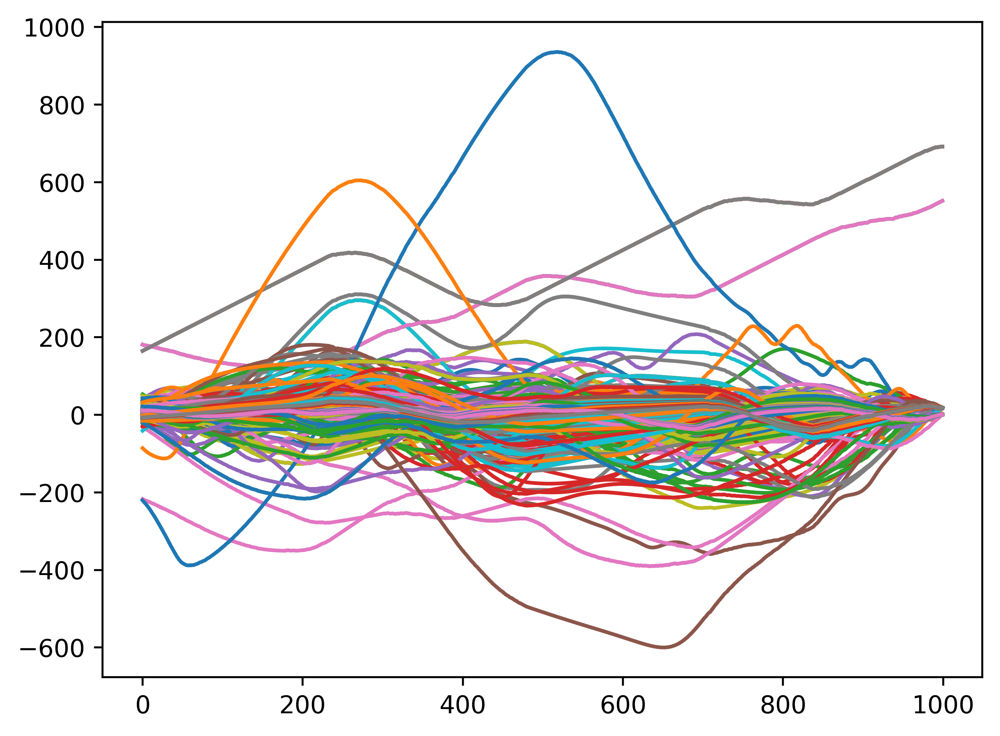

In [10]:
samples_runs = 50
# this will define the computational time

sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])
sampler.run_mcmc(p0, samples_runs) 
samp = sampler.get_chain()

samp_reshaped = samp.reshape(samp.shape[0], -1) #so that the 3D array is reshaped as 2D, to save it 
np.savetxt('samples_emcee.txt',samp_reshaped, delimiter=',')

In [11]:
sampsubset = samp[0:samples_runs,:,:]
samp2d = sampsubset.reshape(sampsubset.shape[0]*sampsubset.shape[1],3)
samp2d.shape
samp2d

np.savetxt('bend4data.txt', np.c_[samp2d])    #year.bend

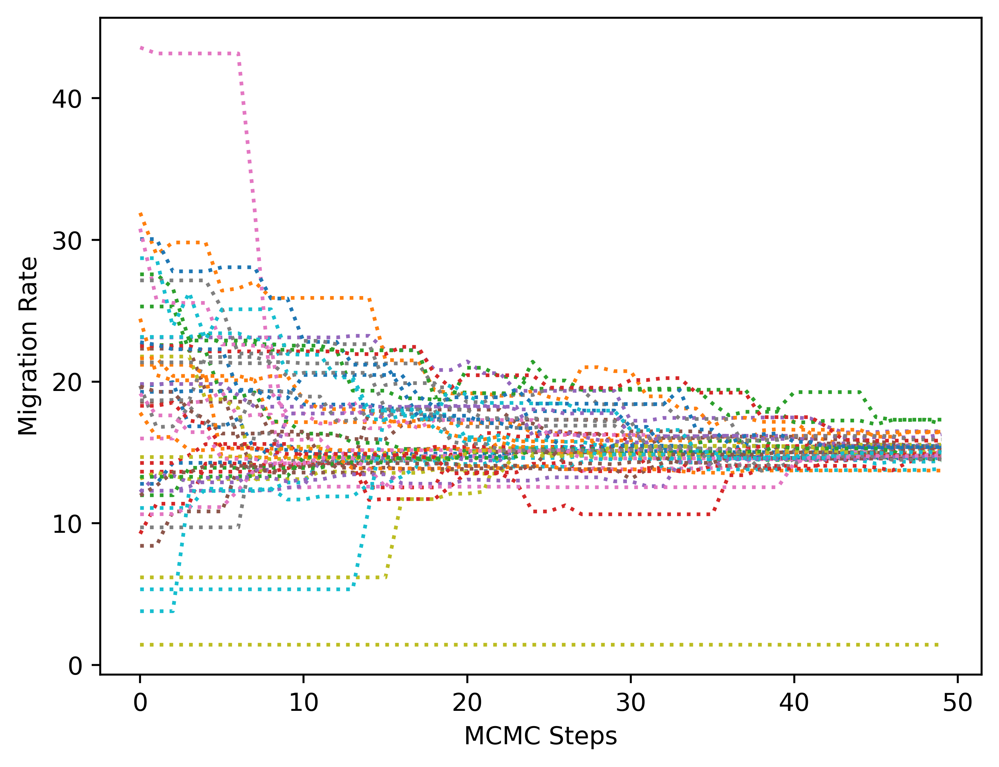

In [12]:
plt.plot(sampler.chain[:,:,0].T, ':')
plt.ylabel("Migration Rate",color='black')
plt.xlabel("MCMC Steps",color='black')


plt.savefig('migrations.PNG',dpi = 200)

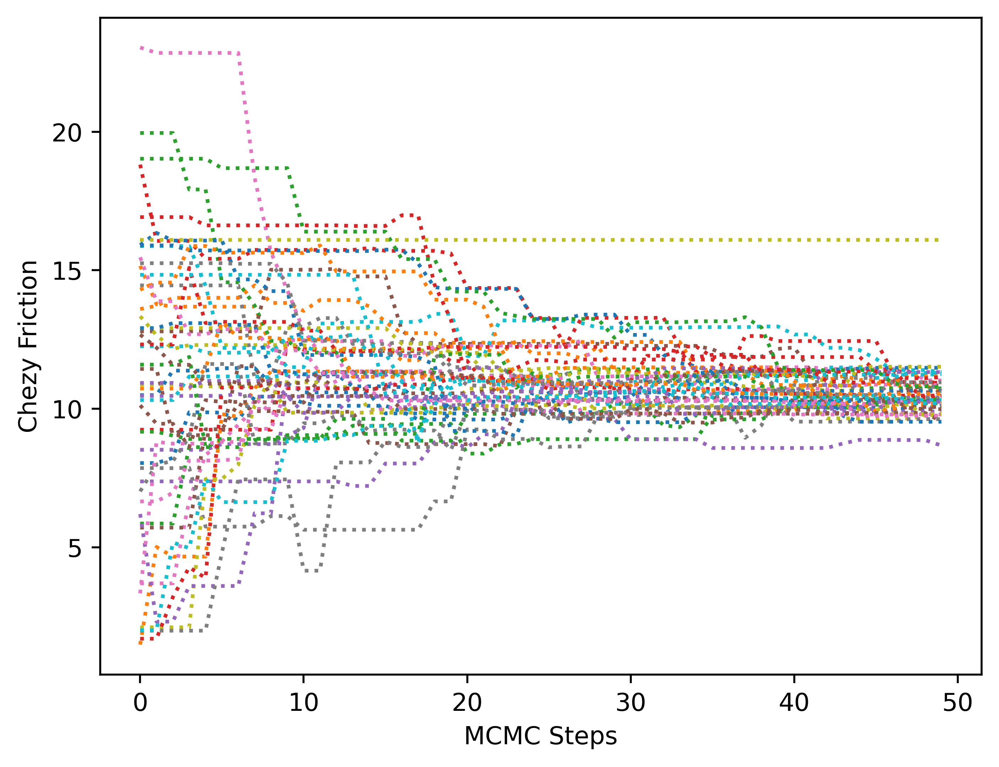

In [13]:
plt.plot(sampler.chain[:,:,1].T, ':')
plt.ylabel("Chezy Friction",color='black')
plt.xlabel("MCMC Steps",color='black')
plt.savefig('migrations.PNG',dpi = 200)

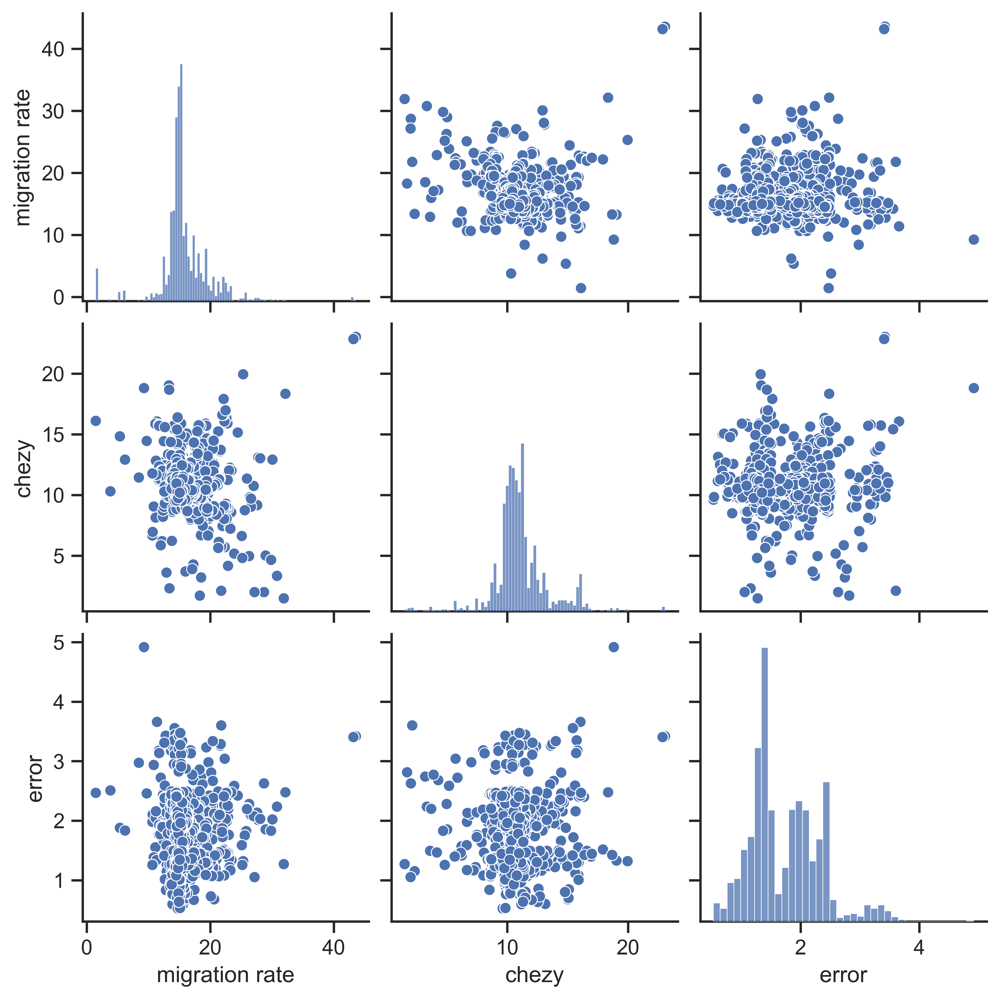

In [14]:
plt.rcParams.update({'font.size': 22}) # must set in top

samp_df = pd.DataFrame(samp2d)
samp_df = samp_df.rename(columns={0: 'migration rate',  1: 'chezy', 2: 'error'})   

samp_df
sns.color_palette("mako")
sns.set(style="ticks")
b = sns.pairplot(samp_df)

plt.savefig('kde%s.PNG',dpi = 300)

100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 598.12it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/254141998.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/254141998.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you 

631035
5959
3006


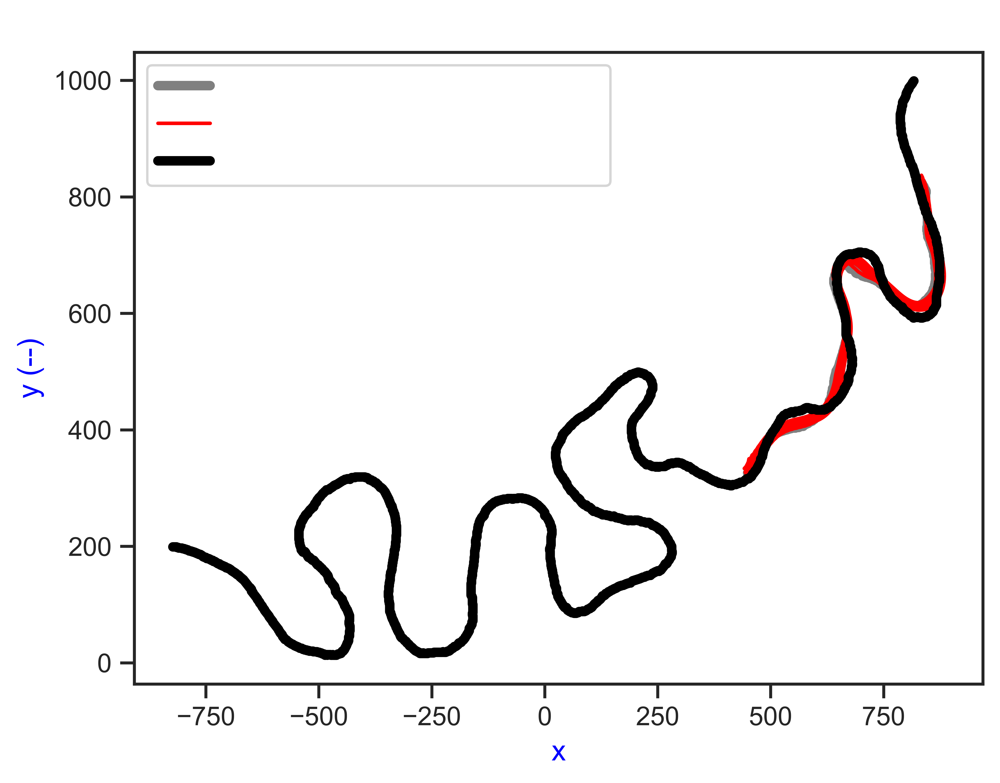

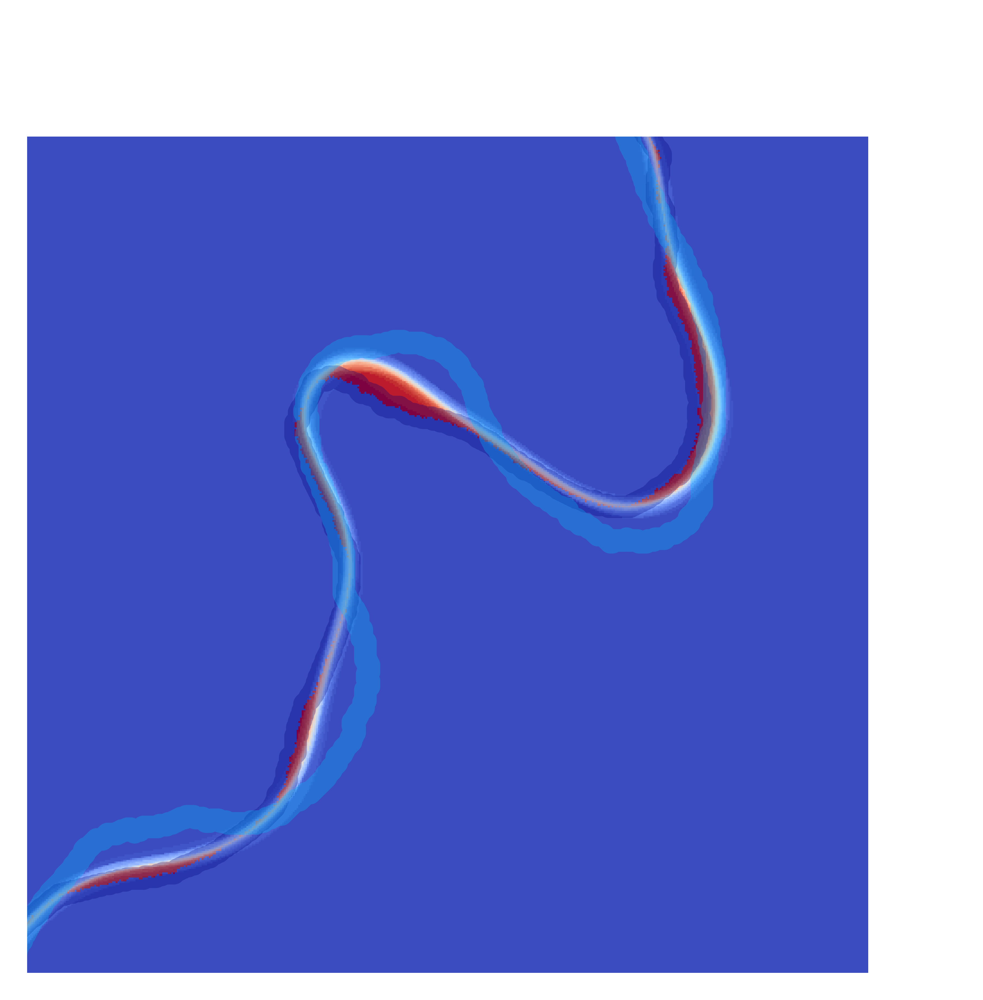

In [17]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend3")
cl1=np.loadtxt('0.3.txt',delimiter=' ')
cl0=np.loadtxt('0.3.txt',delimiter=' ')

cl2=np.loadtxt('CL6.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 50                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([290, 760])
plt.ylim([150, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.45it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/4039801502.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/4039801502.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

626688
5906
7406


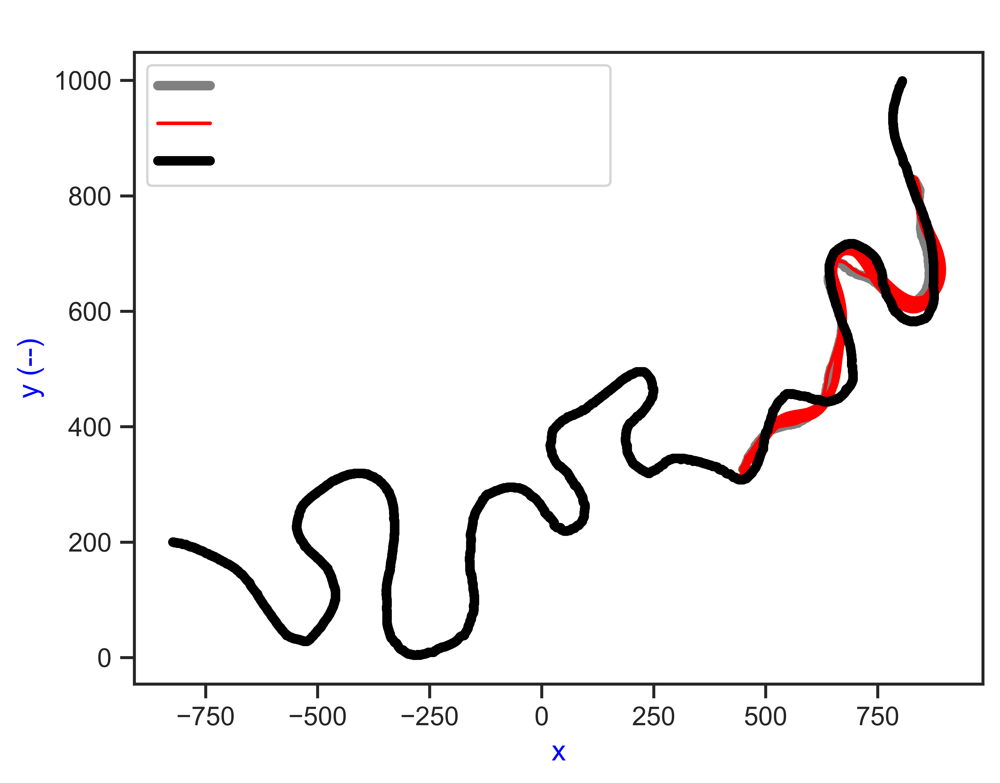

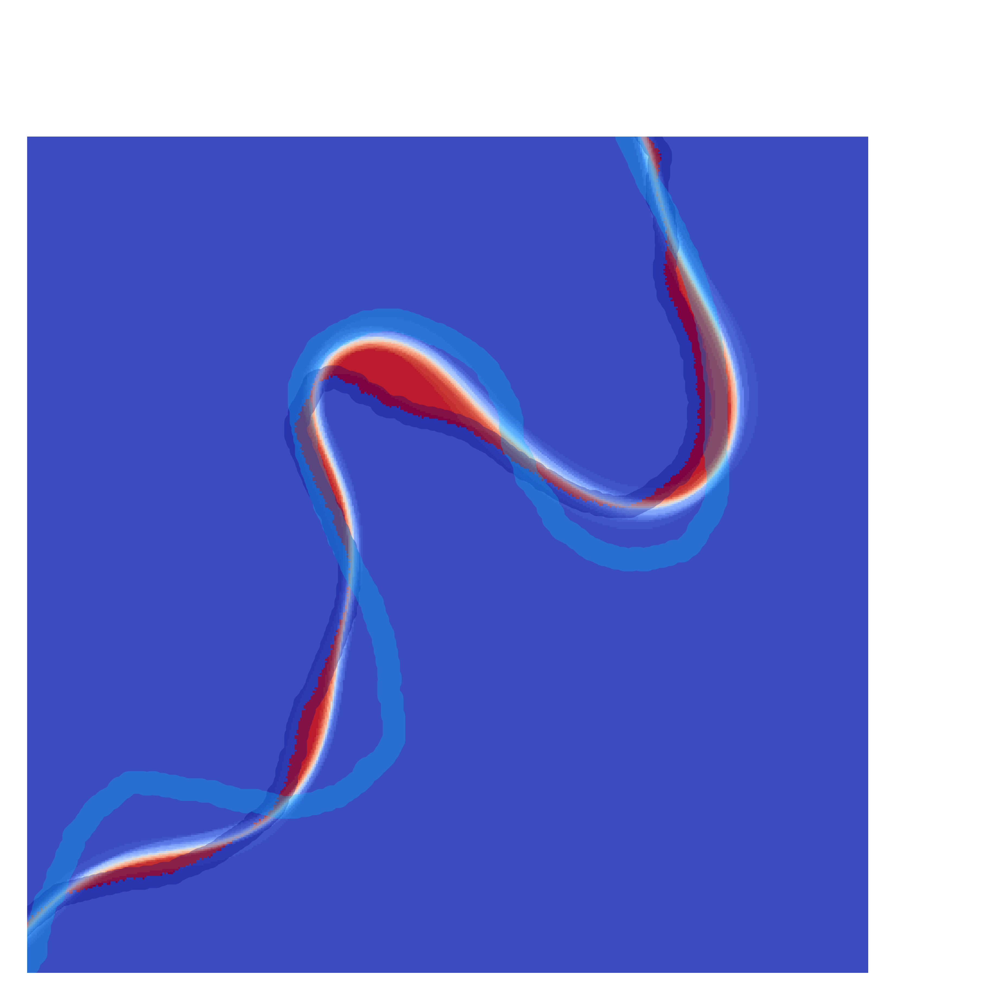

In [18]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend3")
cl1=np.loadtxt('0.3.txt',delimiter=' ')
cl0=np.loadtxt('0.3.txt',delimiter=' ')

cl2=np.loadtxt('CL11.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 100                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([290, 760])
plt.ylim([150, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|████████████████████████████████████████| 150/150 [00:00<00:00, 575.78it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/3954640646.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/3954640646.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

621275
6779
11946


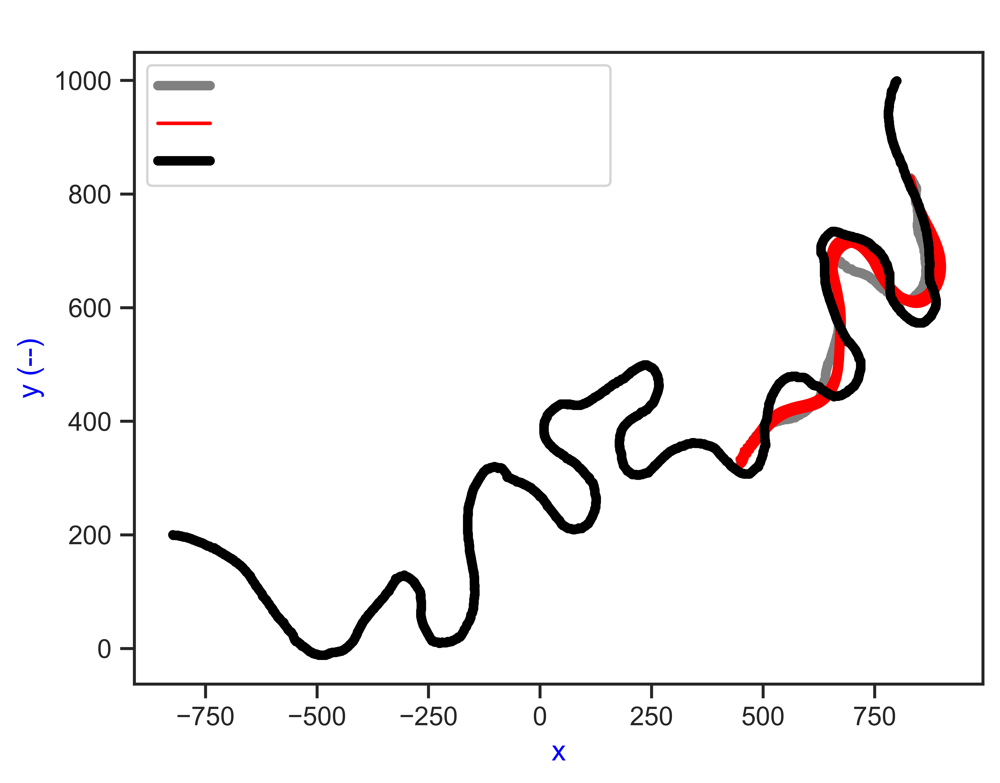

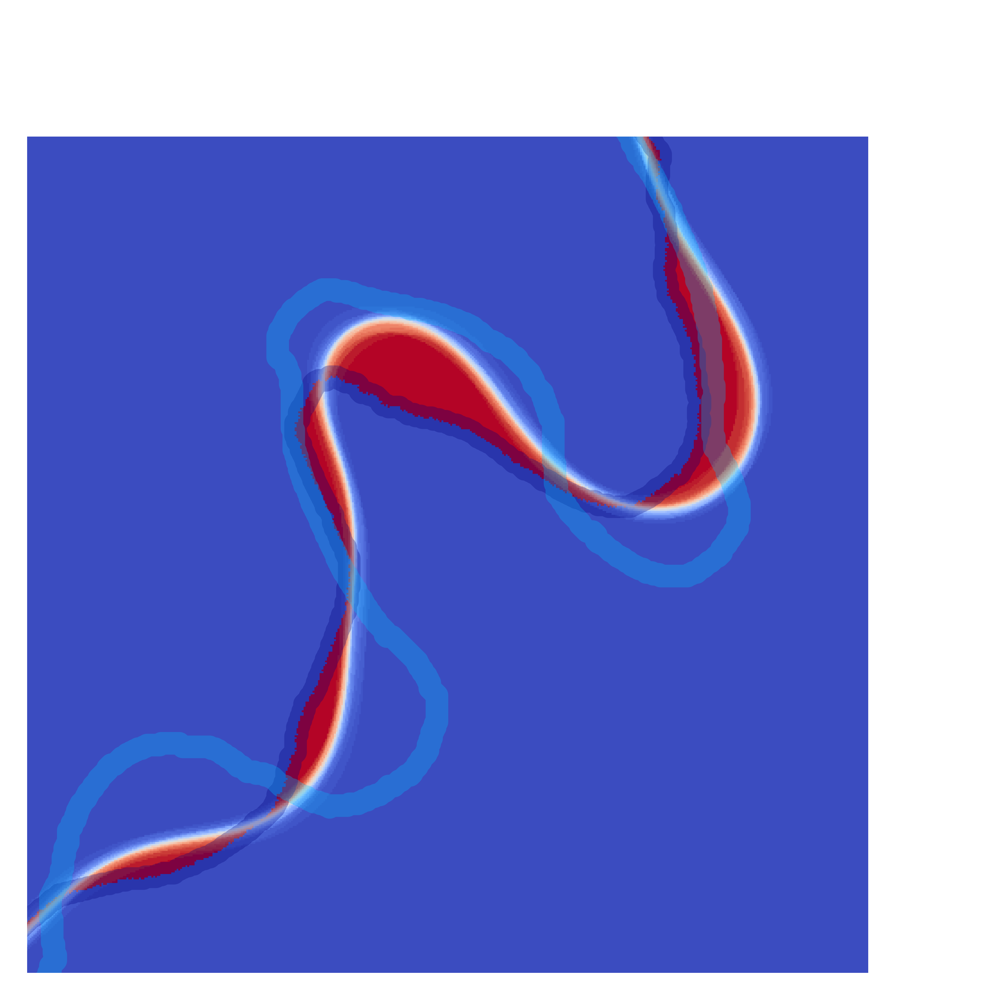

In [19]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend3")
cl1=np.loadtxt('0.3.txt',delimiter=' ')
cl0=np.loadtxt('0.3.txt',delimiter=' ')

cl2=np.loadtxt('CL16.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 150                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([290, 760])
plt.ylim([150, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|████████████████████████████████████████| 200/200 [00:00<00:00, 615.64it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/787208941.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/787208941.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you 

615527
8378
16095


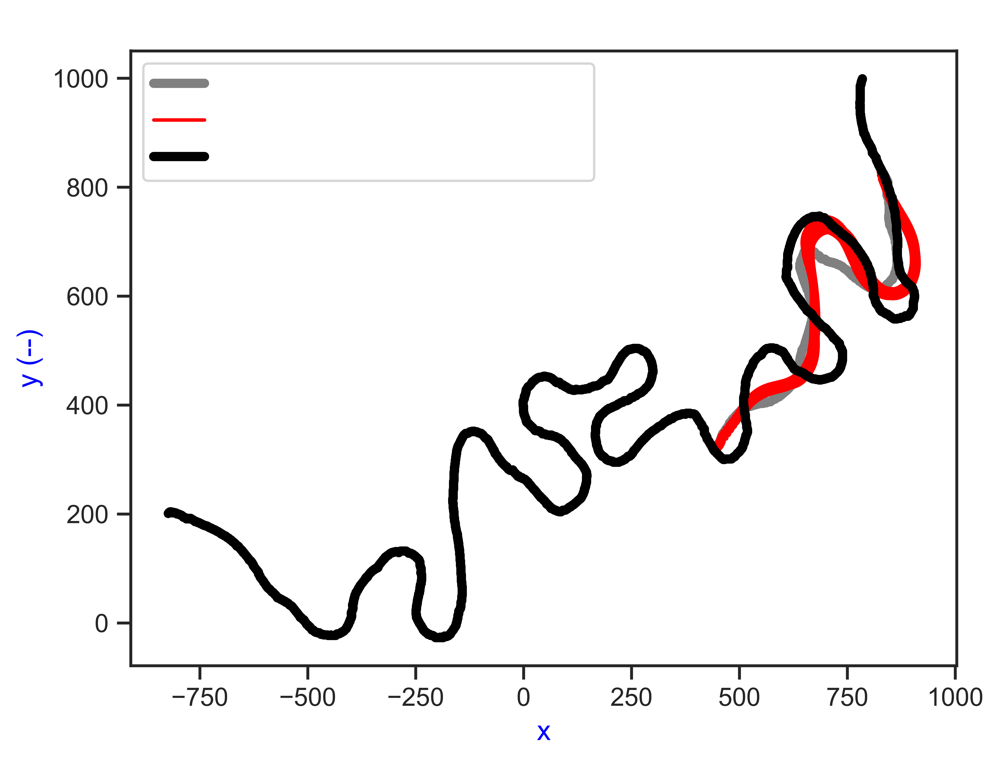

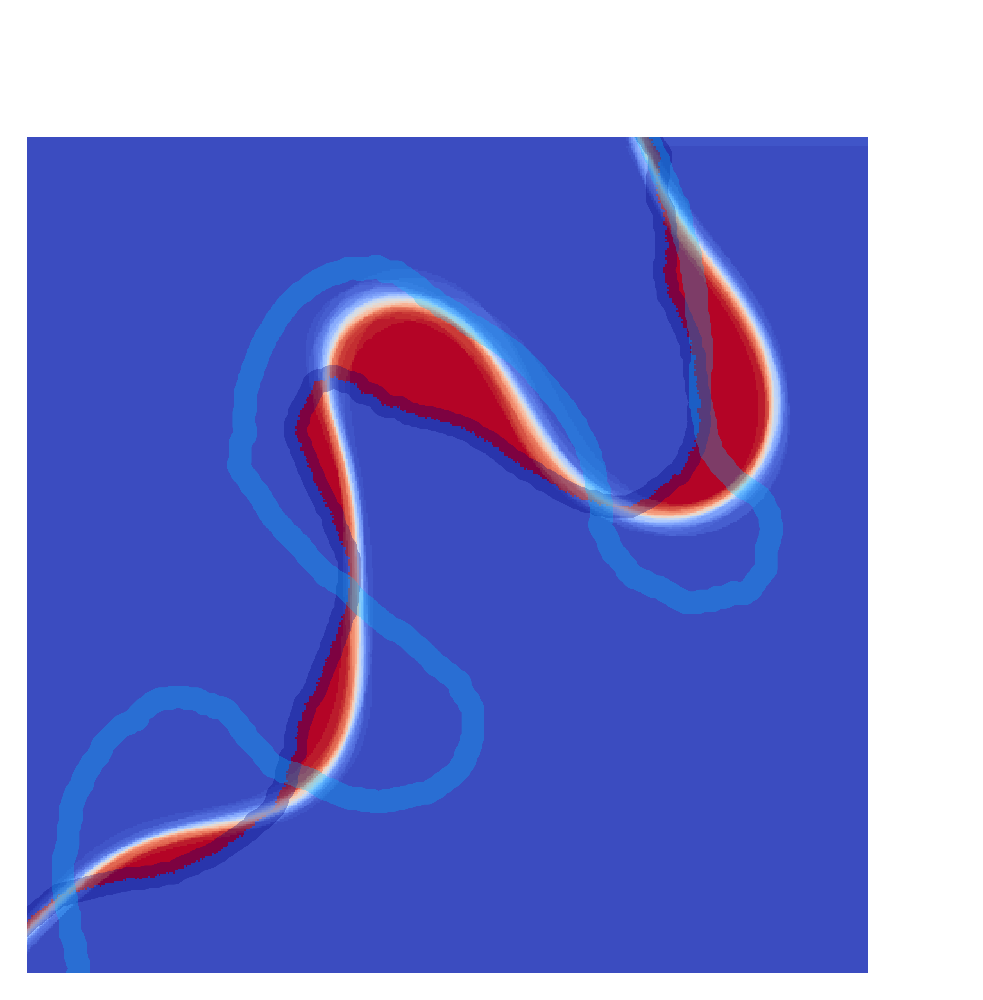

In [20]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend3")
cl1=np.loadtxt('0.3.txt',delimiter=' ')
cl0=np.loadtxt('0.3.txt',delimiter=' ')

cl2=np.loadtxt('CL21.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 200                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([290, 760])
plt.ylim([150, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|████████████████████████████████████████| 250/250 [00:00<00:00, 602.61it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/75554707.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/75554707.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you ma

611402
8947
19651


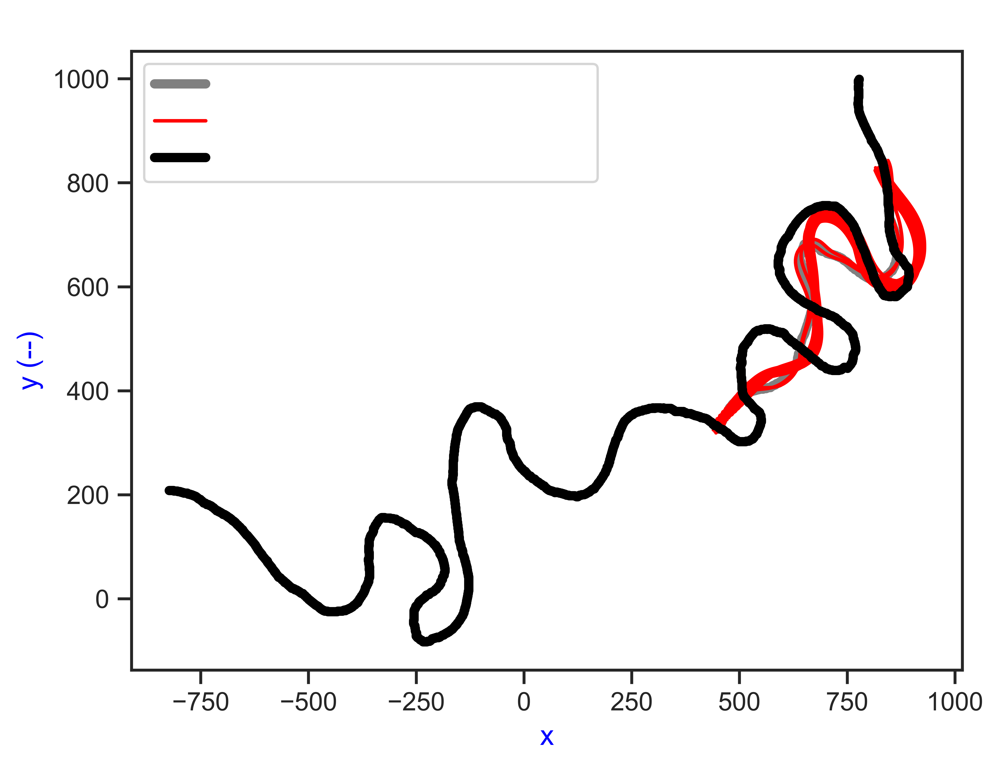

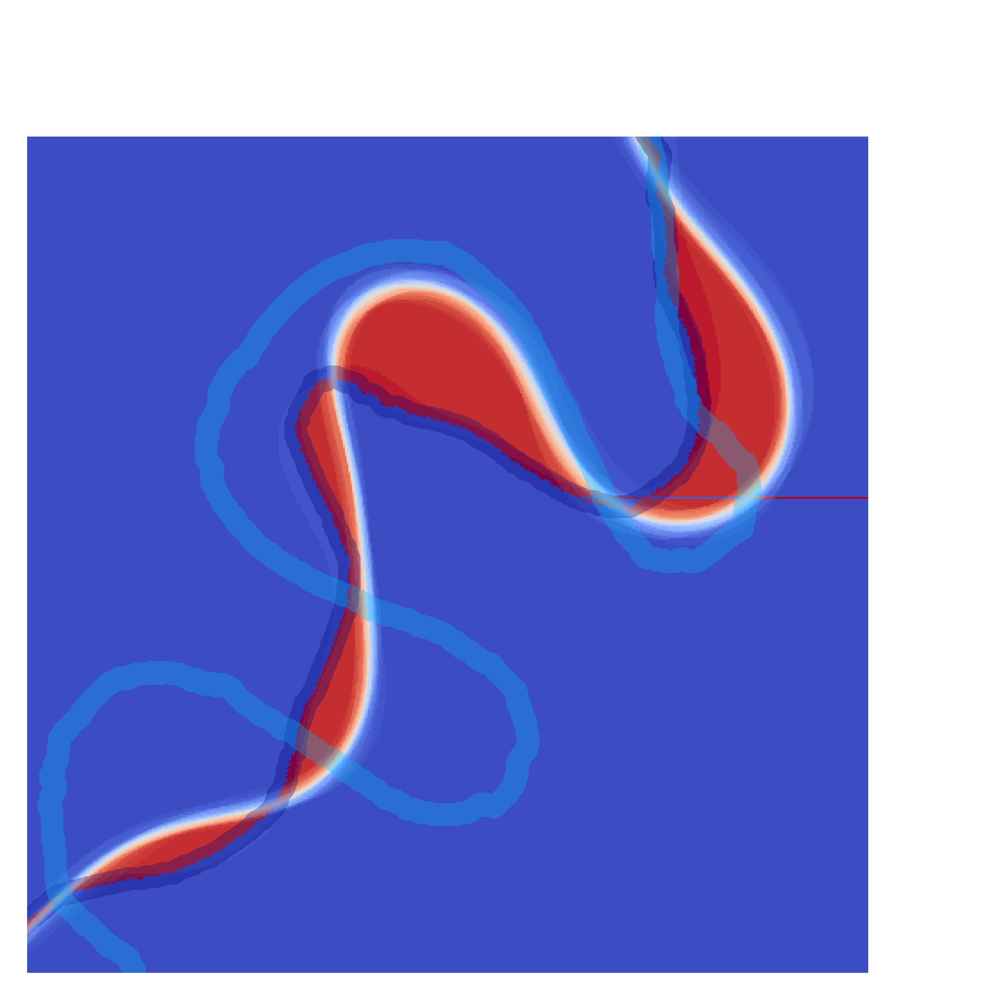

In [21]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend3")
cl1=np.loadtxt('0.3.txt',delimiter=' ')
cl0=np.loadtxt('0.3.txt',delimiter=' ')

cl2=np.loadtxt('CL26.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 250                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([290, 760])
plt.ylim([150, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|████████████████████████████████████████| 300/300 [00:00<00:00, 510.88it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/289993941.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57412/289993941.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you 

606919
8786
24295


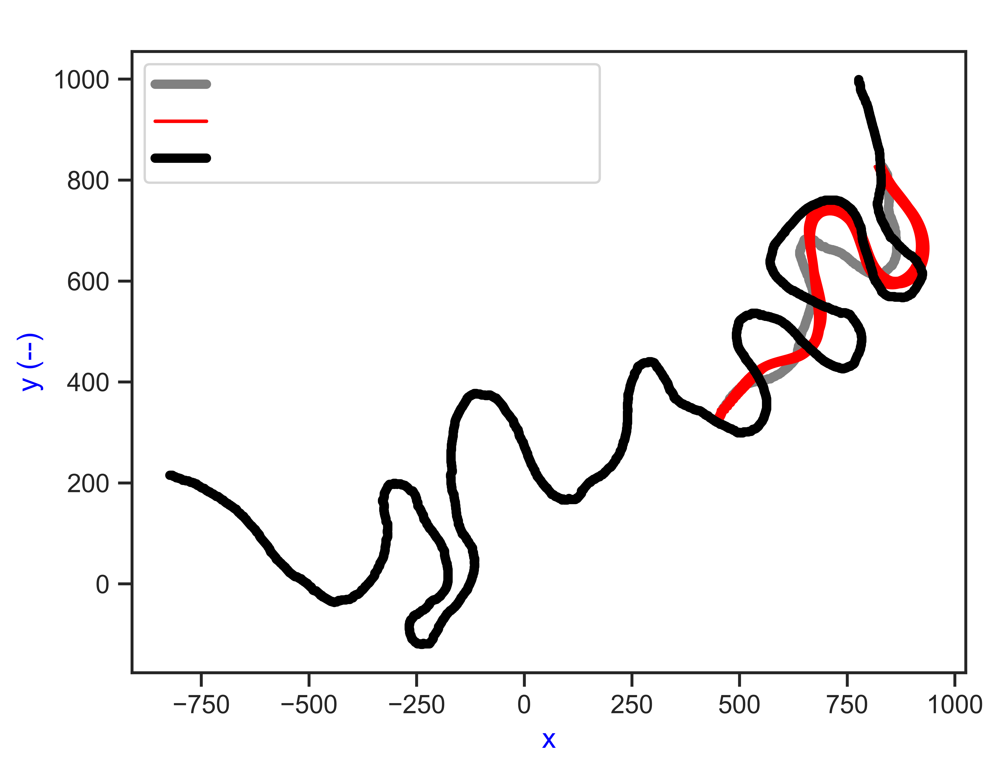

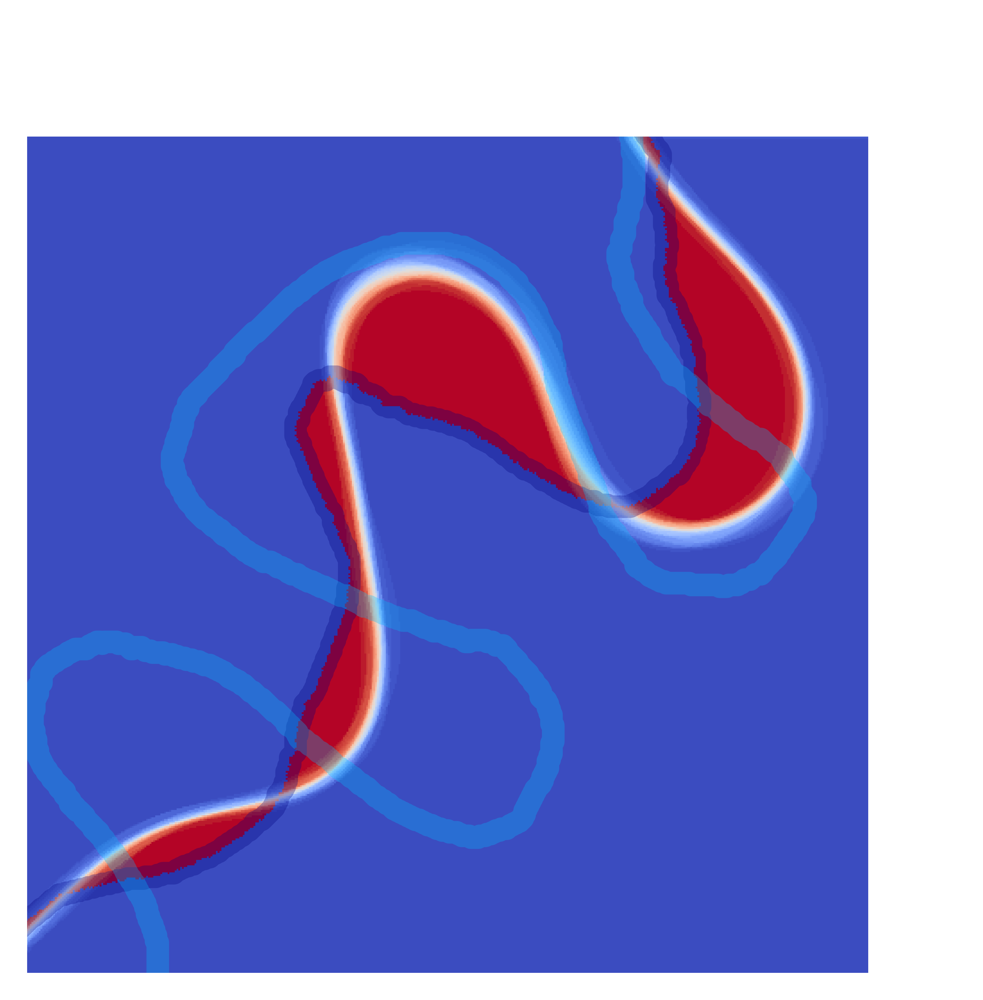

In [22]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend3")
cl1=np.loadtxt('0.3.txt',delimiter=' ')
cl0=np.loadtxt('0.3.txt',delimiter=' ')

cl2=np.loadtxt('CL31.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 300                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([290, 760])
plt.ylim([150, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)